# CSE603: Machine Learning - II

# Assignment 1

### Submitted by:
#### Name      : Muhammad Amin Ghias
#### ERP ID    : 25366

Date : 17th September 2022

# Analysis on Datasets for Classification

## Importing Libraries

In [57]:
import pandas as pd  
import matplotlib.pyplot as plt
import time

from sklearn.linear_model import LogisticRegression 
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import train_test_split, RepeatedKFold, GridSearchCV, cross_val_score
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import MinMaxScaler

from sklearn.pipeline import Pipeline


import warnings 
warnings.filterwarnings('ignore')


from sklearn.preprocessing import LabelEncoder
from mixed_naive_bayes import MixedNB
import numpy as np  
import matplotlib.pyplot as plt
import time

from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import MultinomialNB, CategoricalNB, GaussianNB
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import train_test_split, RepeatedKFold, GridSearchCV, cross_val_score
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import MinMaxScaler

from sklearn.pipeline import Pipeline
from matplotlib import pyplot

from numpy import mean


import warnings 
warnings.filterwarnings('ignore')

from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.feature_selection import SequentialFeatureSelector
import os

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns


import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np

from sklearn.preprocessing import PolynomialFeatures

from sklearn.linear_model import RidgeCV
from sklearn.model_selection import KFold
from sklearn.model_selection import RepeatedKFold
from numpy import arange
from sklearn.linear_model import LassoCV
import warnings 
warnings.filterwarnings('ignore')

from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from numpy import mean
from sklearn.feature_selection import SequentialFeatureSelector

from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsRegressor


from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score




cv = KFold(n_splits=10, random_state=1, shuffle=True)
# reg = LinearRegression()


from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score
from sklearn.metrics import f1_score, roc_auc_score


from numpy.random import normal
from numpy.random import exponential
import random
import re

import plotly.express as px
import plotly.graph_objects as go


# Making a Class for dataset Creation

In [58]:
class dataset:
    
    dataset_count=0
    
    def __init__(self,column_number,row_number,gausian_percent,poisson_perecnt,exponential_percent,binomial_precent,logistic_perecent):
        
        self.data_dict ={}
        self.df=pd.DataFrame()
        
        self.gausian_list=[]
        self.gausian_dict={}
        
        self.exponential_dict={}
        self.exponential_list=[]
        
        self.binomial_dict={}
        self.binomial_list=[]
        
        self.poisson_dict={}
        self.poisson_list=[]
        
        self.logistic_dict={}
        self.logistic_list=[]
        
        self.label_cl_dict={}
        self.label_cl_list=[]
        
        
        self.row_number=row_number
        self.column_number= column_number
        
        
        self.precent_gausian = gausian_percent
        self.percent_poisson = poisson_perecnt
        self.percent_exponential = exponential_percent
        self.percent_binomial = binomial_precent
        self.percent_logistic = logistic_perecent
        
        
        self.col_gausian = int(column_number*(gausian_percent/100))
        self.col_poisson = int(column_number*(poisson_perecnt/100))
        self.col_exponential = int(column_number*(exponential_percent/100))
        self.col_binomial = int(column_number*(binomial_precent/100))
        self.col_logistic = int(column_number*(logistic_perecent/100))
        
        self.total= self.col_gausian + self.col_poisson + self.col_exponential +  self.col_binomial + self.col_logistic 
        
        if self.total < self.column_number:
            self.col_gausian = self.col_gausian + (self.column_number-self.total)
            
        
        self.total= self.col_gausian + self.col_poisson + self.col_exponential +  self.col_binomial + self.col_logistic 
        
    def print_desc(self):
        print("The data frame should have columns :", self.column_number)
        print("The data frame will have rows :", self.row_number)
        print("the ",self.precent_gausian, "% of gaussian distrubution  in our dataset will have gausian distributed columns :", self.col_gausian )
        print("the ",self.percent_poisson, "% of poisson distrubution  in our dataset will have poisson distributed columns :", self.col_poisson )
        print("the ",self.percent_exponential, "% of exponential distrubution  in our dataset will have exponential distributed columns :", self.col_exponential )
        print("the ",self.percent_binomial, "% of binomial distrubution  in our dataset will have binomial distributed columns :", self.col_binomial )
        print("the ",self.percent_logistic, "% of logistic distrubution  in our dataset will have logistic distributed columns :", self.col_logistic )
        print("The data frame will have total columns :", self.total)
     
        
    def make_gausian(self,mu,sigma):
        
        if type(mu) != list:
            mu=[mu]

        avg= sum(mu)/len(mu)
        avg= int(avg)
        if len(mu) < self.col_gausian:
            p=self.col_gausian-(len(mu))
            r=list(np.random.randint(int(avg-(0.2*avg)), int(avg+(0.2*avg)), p))

            mu = mu + r
        
        if type(sigma) != list:
            sigma=[sigma]
        avg= sum(sigma)/len(sigma)
        avg= int(avg)
        if len(sigma) < self.col_gausian:
            p=self.col_gausian-(len(sigma))
            
            r=list(np.random.randint(int(avg-(0.2*avg)), int(avg+(0.2*avg)), p))
            sigma = sigma + r
        
        self.mu=mu
        self.sigma=sigma
        n=self.row_number
        
        self.avg_mu= sum(self.mu)/len(self.mu)
        self.avg_sigma= sum(self.sigma)/len(self.sigma)
  
        for i in range(self.col_gausian):
            sample =np.random.normal(self.mu[i], self.sigma[i], n)
            s = pd.Series(sample)
            self.gausian_list.append(s)
            self.data_dict['gaus'+str(i+1)]=s
            self.gausian_dict['gaus'+str(i+1)]=s
            
        self.df_gausian=pd.DataFrame(self.gausian_dict)
            

    def make_exponential(self,beta):
        
        if type(beta) != list:
            beta=[beta]
        avg= sum(beta)/len(beta)
        avg= int(avg)
        if len(beta) < self.col_exponential:
            p=self.col_exponential-(len(beta))
            r=list(np.random.randint(int(avg-(0.2*avg)), int(avg+(0.2*avg)), p))
            beta = beta + r
            
        self.beta=beta
        n=self.row_number
        
        self.avg_beta= sum(self.beta)/len(self.beta)
                
        for i in range(self.col_exponential):
            sample =np.random.exponential(self.beta[i],  n)
            s = pd.Series(sample)
            self.exponential_list.append(s)
            self.data_dict['exp'+str(i+1)]=s
            self.exponential_dict['exp'+str(i+1)]=s
            
        self.df_exponential=pd.DataFrame(self.exponential_dict)
            
    
    
    def make_binomial(self,number_of_trials,prob_of_success_of_trial):
        
        if type(number_of_trials) != list:
            number_of_trials=[number_of_trials]
        avg= sum(number_of_trials)/len(number_of_trials)
        avg= int(avg)
        if len(number_of_trials) < self.col_binomial:
            p=self.col_binomial-(len(number_of_trials))
            r=list(np.random.randint(int(avg-(0.2*avg)), int(avg+(0.2*avg)), p))
            number_of_trials = number_of_trials + r
        
        if type(prob_of_success_of_trial) != list:
            prob_of_success_of_trial=[prob_of_success_of_trial]
        avg= sum(prob_of_success_of_trial)/len(prob_of_success_of_trial)
        
        
        if len(prob_of_success_of_trial) < self.col_binomial:
            p=self.col_binomial-(len(prob_of_success_of_trial))
            r=list(np.random.randint(int(100*(avg-(0.2*avg))), int(100*(avg+(0.2*avg))), p))
            r = [x/100 for x in r]
        
            prob_of_success_of_trial = prob_of_success_of_trial + r
        
        self.number_of_trials=number_of_trials
        self.prob_of_success_of_trial=prob_of_success_of_trial
        n=self.row_number
        
        self.avg_number_of_trials= sum(self.number_of_trials)/len(self.number_of_trials)
        self.avg_prob_of_success_of_trial= sum(self.prob_of_success_of_trial)/len(self.prob_of_success_of_trial)

        for i in range(self.col_binomial):
            sample =np.random.binomial(self.number_of_trials[i], self.prob_of_success_of_trial[i], n)
            s = pd.Series(sample)
            self.binomial_list.append(s)
            self.data_dict['binom'+str(i+1)]=s
            self.binomial_dict['binom'+str(i+1)]=s
            
        self.df_binomial=pd.DataFrame(self.binomial_dict)
        
        
    
    def make_poisson(self,lamd):
    
        if type(lamd) != list:
            lamd=[lamd]
        avg= sum(lamd)/len(lamd)
        avg= int(avg)
        if len(lamd) < self.col_poisson:
            p=self.col_poisson-(len(lamd))
            r=list(np.random.randint(int(avg-(0.2*avg)), int(avg+(0.2*avg)), p))
            lamd = lamd + r
            
        self.lamd=lamd
        n=self.row_number
        
        self.avg_lamd= sum(self.lamd)/len(self.lamd)
                
        for i in range(self.col_poisson):
            sample =np.random.poisson(self.lamd[i],  n)
            s = pd.Series(sample)
            self.poisson_list.append(s)
            self.data_dict['pois'+str(i+1)]=s
            self.poisson_dict['pois'+str(i+1)]=s
            
        self.df_poisson=pd.DataFrame(self.poisson_dict)
    
    
    
    
    # loc - mean, where the peak is. Default 0.
    # scale - standard deviation, the flatness of distribution. Default 1.
    # size - The shape of the returned array.
    
    def make_logistic(self,loc,scale):
        
        if type(loc) != list:
            loc=[loc]
        avg= sum(loc)/len(loc)
        avg= int(avg)
        if len(loc) < self.col_logistic:
            p=self.col_logistic-(len(loc))
            r=list(np.random.randint(int(avg-(0.2*avg)), int(avg+(0.2*avg)), p))
            loc = loc + r
        
        if type(scale) != list:
            scale=[scale]
        avg= sum(scale)/len(scale)
        avg= int(avg)
        if len(scale) < self.col_logistic:
            p=self.col_logistic-(len(scale))
            
            r=list(np.random.randint(int(avg-(0.2*avg)), int(avg+(0.2*avg)), p))
            scale = scale + r
        
        self.loc=loc
        self.scale=scale
        n=self.row_number
        
        self.avg_loc= sum(self.loc)/len(self.loc)
        self.avg_scale= sum(self.scale)/len(self.scale)
  
        for i in range(self.col_logistic):
            sample =np.random.logistic(self.loc[i], self.scale[i], n)
            s = pd.Series(sample)
            self.logistic_list.append(s)
            self.data_dict['log'+str(i+1)]=s
            self.logistic_dict['log'+str(i+1)]=s
            
        self.df_logistic=pd.DataFrame(self.logistic_dict)
    
    
    
    def make_label_cl(self):
    
        n=self.row_number
        
        
        
        sample =np.random.binomial(1, 0.65, n)
        
        s = pd.Series(sample)
        self.label_cl_list.append(s)
        self.data_dict['cl']=s
        self.label_cl_dict['cl']=s
            
        self.df_cl=pd.DataFrame(self.label_cl_dict)
        
    
    def make_dataframe(self):
        
        self.df=pd.DataFrame(self.data_dict)
        return(self.df)
    
    
    def change_dataframe_incr(self,percent):
        
        self.change_percent = 1 + (percent/100)
        n=self.row_number
        l = self.column_number -1
        p = int(self.column_number*0.3)
        r=random.sample(range(0, l), p)
        col = self.df.columns
        n=self.row_number
        
        self.df_ch_incr=self.df.copy()
        
        
        for i in r:
            
            c = col[i]
            
            if re.match('gaus', c):
                
                k=int(c[4])
              
                old_mu= self.mu[k-1]
                new_mu= int(self.mu[k-1]*self.change_percent)
                print('The old mu value is :',old_mu, 'new chnaged mu value is :',new_mu)
                
                old_sigma= self.sigma[k-1]
                new_sigma= int(self.sigma[k-1]*self.change_percent)
                print('The old sigma value is :',old_sigma, 'new chnaged sigma value is :',new_sigma)
                
                sample =np.random.normal(new_mu, new_sigma, n)
                s = pd.Series(sample)
                print(c)
                print(k)
                self.df_ch_incr[c]=s
                
            elif re.match('exp', c):
                
                k=int(c[3])
               
                old_beta= self.beta[k-1]
                new_beta= int(self.beta[k-1]*self.change_percent)
                print('The old beta value is :',old_beta, 'new chnaged beta value is :',new_beta)
                
                
                sample =np.random.exponential(new_beta, n)
                s = pd.Series(sample)
                print(c)
                self.df_ch_incr[c]=s
                
            elif re.match('pois', c):
                
                k=int(c[4])
               
                old_lamd= self.lamd[k-1]
                new_lamd= int(self.lamd[k-1]*self.change_percent)
                print('The old lamd value is :',old_lamd, 'new chnaged lamd value is :',new_lamd)
                

                sample =np.random.poisson(new_lamd,  n)
                s = pd.Series(sample)
                print(c)
                self.df_ch_incr[c]=s
                
            elif re.match('log', c):
                
                k=int(c[3])
               
                old_loc= self.loc[k-1]
                new_loc= int(self.loc[k-1]*self.change_percent)
                print('The old loc value is :',old_loc, 'new chnaged loc value is :',new_loc)
                
                old_scale= self.scale[k-1]
                new_scale= int(self.scale[k-1]*self.change_percent)
                print('The old scale value is :',old_scale, 'new chnaged scale value is :',new_scale)
                
                sample =np.random.logistic(new_loc, new_scale, n)
                s = pd.Series(sample)
                print(c)
                self.df_ch_incr[c]=s
                
            elif re.match('bin', c):
                
                k=int(c[5])
            
                old_number_of_trials= self.number_of_trials[k-1]
                new_number_of_trials= int(self.number_of_trials[k-1]*self.change_percent)
                print('The old number_of_trials value is :',old_number_of_trials, 'new chnaged number_of_trials value is :',new_number_of_trials)
                
                old_prob_of_success_of_trial= self.prob_of_success_of_trial[k-1]
                new_prob_of_success_of_trial= self.prob_of_success_of_trial[k-1]*self.change_percent
                print('The old prob_of_success_of_trial value is :',old_prob_of_success_of_trial, 'new chnaged prob_of_success_of_trial value is :',new_prob_of_success_of_trial)
                
                sample =np.random.binomial(new_number_of_trials, new_prob_of_success_of_trial, n)
                
                s = pd.Series(sample)
                print(c)
                self.df_ch_incr[c]=s
        
        return(self.df_ch_incr)
                
                
    def change_dataframe_decr(self,percent):
        
        self.change_percent = 1 - (percent/100)
        n=self.row_number
        l = self.column_number -1
        p = int(self.column_number*0.3)
        r=random.sample(range(0, l), p)
        col = self.df.columns
        n=self.row_number
        
        self.df_ch_decr=self.df.copy()
        
        for i in r:
            
            c = col[i]
            
            if re.match('gaus', c):
                
                k=int(c[4])
              
                old_mu= self.mu[k-1]
                new_mu= int(self.mu[k-1]*self.change_percent)
                print('The old mu value is :',old_mu, 'new chnaged mu value is :',new_mu)
                
                old_sigma= self.sigma[k-1]
                new_sigma= int(self.sigma[k-1]*self.change_percent)
                print('The old sigma value is :',old_sigma, 'new chnaged sigma value is :',new_sigma)
                
                sample =np.random.normal(new_mu, new_sigma, n)
                s = pd.Series(sample)
                print(c)
                print(k)
                self.df_ch_decr[c]=s
                
            elif re.match('exp', c):
                
                k=int(c[3])
               
                old_beta= self.beta[k-1]
                new_beta= int(self.beta[k-1]*self.change_percent)
                print('The old beta value is :',old_beta, 'new chnaged beta value is :',new_beta)
                
                
                sample =np.random.exponential(new_beta, n)
                s = pd.Series(sample)
                print(c)
                self.df_ch_decr[c]=s
                
            elif re.match('pois', c):
                
                k=int(c[4])
               
                old_lamd= self.lamd[k-1]
                new_lamd= int(self.lamd[k-1]*self.change_percent)
                print('The old lamd value is :',old_lamd, 'new chnaged lamd value is :',new_lamd)
                

                sample =np.random.poisson(new_lamd,  n)
                s = pd.Series(sample)
                print(c)
                self.df_ch_decr[c]=s
                
            elif re.match('log', c):
                
                k=int(c[3])
               
                old_loc= self.loc[k-1]
                new_loc= int(self.loc[k-1]*self.change_percent)
                print('The old loc value is :',old_loc, 'new chnaged loc value is :',new_loc)
                
                old_scale= self.scale[k-1]
                new_scale= int(self.scale[k-1]*self.change_percent)
                print('The old scale value is :',old_scale, 'new chnaged scale value is :',new_scale)
                
                sample =np.random.logistic(new_loc, new_scale, n)
                s = pd.Series(sample)
                print(c)
                self.df_ch_decr[c]=s
                
            elif re.match('bin', c):
                
                k=int(c[5])
            
                old_number_of_trials= self.number_of_trials[k-1]
                new_number_of_trials= int(self.number_of_trials[k-1]*self.change_percent)
                print('The old number_of_trials value is :',old_number_of_trials, 'new chnaged number_of_trials value is :',new_number_of_trials)
                
                old_prob_of_success_of_trial= self.prob_of_success_of_trial[k-1]
                new_prob_of_success_of_trial= self.prob_of_success_of_trial[k-1]*self.change_percent
                print('The old prob_of_success_of_trial value is :',old_prob_of_success_of_trial, 'new chnaged prob_of_success_of_trial value is :',new_prob_of_success_of_trial)
                
                sample =np.random.binomial(new_number_of_trials, new_prob_of_success_of_trial, n)
                
                s = pd.Series(sample)
                print(c)
                self.df_ch_decr[c]=s
                
        return(self.df_ch_decr)   
    
    
    def print_parameters_desc(self):
       
        print('Distribution parameters')
        
        print('\nFor Gausian Distribution:')
        print('mu :', self.mu,'\nsigma :',self.sigma)   
        
        print('\nFor Exponential Distribution:')
        print('beat :', self.beta,) 
        
        print('\nFor Poisson Distribution:')
        print('lambda :', self.lamd)  
        
        print('\nFor Binomial Distribution:')
        print('number_of_trials :', self.number_of_trials,'\nprob_of_success_of_trial :',self.prob_of_success_of_trial)
        
        print('\nFor Logistic Distribution:')
        print('loc :', self.loc,'\nscale :',self.scale)    

            
    @classmethod   
    def count_dataset(cls):
        return (cls.dataset_count+1)
    
       
  

## Note:

#### The percentage of distibution required were : 60% should follow the gaussian distribution,5% poisson, 10% exponential, 20% binomial, and 5% the logistic distribution
#### The dataset is prepared by randomly chosing the pd distribution parameters randomly

#### The label cl is made by using bernouli distribution with success probability of 0.65 it introduce some class imbalance in labels. 

#### The pd distribution parameters are randomly chosen in a range of +20% to -20% from its average value given as input to ensure randomness

#### for % pd change random 30 % columns are chosen and their respective pd parameters as changed as per input required % change

# Making Required Dataset

In [59]:
dataset.count_dataset()

1

## Data_1

In [60]:
# dataset((self,column_number,row_number,gausian_percent,poisson_perecnt,exponential_percent,binomial_precent,logistic_perecent))

data_1=dataset(20,75000,60,5,10,20,5)


In [61]:
dataset.count_dataset()

1

## Dataset Description

In [62]:
data_1.print_desc()

The data frame should have columns : 20
The data frame will have rows : 75000
the  60 % of gaussian distrubution  in our dataset will have gausian distributed columns : 12
the  5 % of poisson distrubution  in our dataset will have poisson distributed columns : 1
the  10 % of exponential distrubution  in our dataset will have exponential distributed columns : 2
the  20 % of binomial distrubution  in our dataset will have binomial distributed columns : 4
the  5 % of logistic distrubution  in our dataset will have logistic distributed columns : 1
The data frame will have total columns : 20


## Creating Dataset

In [63]:
data_1.make_gausian(500,12)

data_1.make_poisson(20)

data_1.make_exponential(50)

data_1.make_binomial(200,0.5)

data_1.make_logistic(100,5)

data_1.make_label_cl()

data_1.make_dataframe()

df_1=data_1.df

print(df_1.shape)

df_1.head()

(75000, 21)


,gaus1,gaus2,gaus3,gaus4,gaus5,gaus6,gaus7,gaus8,gaus9,gaus10,...,gaus12,pois1,exp1,exp2,binom1,binom2,binom3,binom4,log1,cl
0,502.299788,454.456153,465.031269,504.082385,473.184824,469.331972,412.489304,406.375588,571.575162,491.242626,...,449.882699,20,9.895331,18.397667,89,107,78,116,98.566470,1
1,502.050417,461.772216,485.188449,506.983898,460.454595,488.157349,423.255760,405.703109,571.782292,485.081534,...,482.058498,15,17.322458,66.194443,105,110,77,117,95.270764,1
2,497.835524,460.379355,449.510064,492.905138,456.968087,447.635327,427.505277,402.592896,581.417040,485.169703,...,470.068505,18,189.175205,75.722064,83,103,83,107,102.198421,1
3,497.124242,461.594186,477.857827,492.841592,468.032502,464.299714,432.654134,401.718605,568.414708,469.751591,...,471.952548,16,61.059921,11.327130,91,108,84,104,103.203160,0
4,486.068644,454.359929,450.795151,487.207807,457.018595,464.903136,438.753021,412.671396,581.643271,508.811005,...,474.151973,13,40.518013,50.490957,106,112,97,115,99.760921,0


## Dataset Distribution parameters description

In [64]:
data_1.print_parameters_desc()

Distribution parameters

For Gausian Distribution:
mu : [500, 459, 464, 491, 461, 460, 421, 403, 570, 484, 428, 471] 
sigma : [12, 11, 13, 10, 10, 12, 9, 10, 13, 13, 11, 11]

For Exponential Distribution:
beat : [50, 47]

For Poisson Distribution:
lambda : [20]

For Binomial Distribution:
number_of_trials : [200, 229, 166, 196] 
prob_of_success_of_trial : [0.5, 0.45, 0.5, 0.57]

For Logistic Distribution:
loc : [100] 
scale : [5]


In [9]:
df_1_5decr=data_1.change_dataframe_decr(5)

df_1_5decr.head()

The old mu value is : 559 new chnaged mu value is : 531
The old sigma value is : 9 new chnaged sigma value is : 8
gaus4
4
The old number_of_trials value is : 200 new chnaged number_of_trials value is : 190
The old prob_of_success_of_trial value is : 0.5 new chnaged prob_of_success_of_trial value is : 0.475
binom1
The old mu value is : 500 new chnaged mu value is : 475
The old sigma value is : 12 new chnaged sigma value is : 11
gaus10
1
The old mu value is : 433 new chnaged mu value is : 411
The old sigma value is : 13 new chnaged sigma value is : 12
gaus6
6
The old number_of_trials value is : 234 new chnaged number_of_trials value is : 222
The old prob_of_success_of_trial value is : 0.42 new chnaged prob_of_success_of_trial value is : 0.39899999999999997
binom4
The old beta value is : 50 new chnaged beta value is : 47
exp1


,gaus1,gaus2,gaus3,gaus4,gaus5,gaus6,gaus7,gaus8,gaus9,gaus10,...,gaus12,pois1,exp1,exp2,binom1,binom2,binom3,binom4,log1,cl
0,498.788375,427.655852,445.840562,532.313131,534.447744,430.496203,477.506586,580.390200,478.937577,481.639373,...,479.272509,23,7.878812,29.099672,89,122,93,80,95.927392,1
1,501.952202,406.471339,452.109111,530.520060,534.453581,395.993597,491.488875,587.323533,447.909054,460.171581,...,477.431514,22,30.358290,140.885104,86,125,109,94,93.124473,1
2,505.497376,406.820134,456.682519,521.660815,551.719926,407.522599,494.860485,608.422676,459.708456,497.555526,...,473.209064,23,17.531758,82.409506,97,135,80,90,99.733309,1
3,518.109415,409.896424,447.195152,539.254985,551.665247,426.072769,515.806079,566.054810,471.149251,479.695621,...,481.769641,22,53.030000,20.913728,97,107,102,86,120.479206,0
4,502.290110,416.484319,450.978924,518.493356,534.454453,424.505422,494.533352,593.618856,433.738111,462.782551,...,494.020159,20,73.788856,62.288292,102,133,102,84,97.511312,1


In [10]:
df_1.head()

,gaus1,gaus2,gaus3,gaus4,gaus5,gaus6,gaus7,gaus8,gaus9,gaus10,...,gaus12,pois1,exp1,exp2,binom1,binom2,binom3,binom4,log1,cl
0,498.788375,427.655852,445.840562,562.293070,534.447744,429.366789,477.506586,580.390200,478.937577,482.378780,...,479.272509,23,0.121846,29.099672,76,122,93,100,95.927392,1
1,501.952202,406.471339,452.109111,559.739421,534.453581,434.903006,491.488875,587.323533,447.909054,452.131082,...,477.431514,22,116.096216,140.885104,93,125,109,96,93.124473,1
2,505.497376,406.820134,456.682519,537.697716,551.719926,415.329051,494.860485,608.422676,459.708456,470.501090,...,473.209064,23,8.663616,82.409506,95,135,80,107,99.733309,1
3,518.109415,409.896424,447.195152,560.862417,551.665247,433.197795,515.806079,566.054810,471.149251,473.963685,...,481.769641,22,22.666267,20.913728,111,107,102,96,120.479206,0
4,502.290110,416.484319,450.978924,554.490590,534.454453,453.199300,494.533352,593.618856,433.738111,463.970607,...,494.020159,20,145.528940,62.288292,95,133,102,89,97.511312,1


# Histogram of original Dataset

In [ ]:
k=int(len(df_1.columns)/2)+1

plt.figure(figsize=(25, 80))

for i, col in enumerate(df_1.columns):

    plt.subplot(k, 2, i+1)
    plt.hist(df_1[col])
    plt.tight_layout()
    plt.title(col,size=30)
    plt.xlabel("Values")
    plt.ylabel("Counts")

# Distribution plot of original dataset

In [ ]:
plt.figure(figsize=(25, 80))

for i, col in enumerate(df_1.columns):
        plt.subplot(k, 2, i+1)
        fig = sns.distplot(df_1[col])
        plt.tight_layout()
        plt.title(col,size=30)
        # plt.show()

# Complete ML- Model

In [65]:
score_df = pd.DataFrame(columns=['data_name','percent_change','model_details',
                                 'fit_time','predict_y_time','predict_prob',
                                 '0_precission','0_recall', '0_f1',
                                 '1_precsiiom','1_recall','1_f1',
                                 'accuracy',
                                 'auc',
                                 'md_auc']
                                )

score_df.head()

,data_name,percent_change,model_details,fit_time,predict_y_time,predict_prob,0_precission,0_recall,0_f1,1_precsiiom,1_recall,1_f1,accuracy,auc,md_auc


In [66]:

def data_models(dataset,data_name,percent_change):
    
    df_1=dataset
    k=int(len(df_1.columns)/2)+1
    
    
    plt.figure(figsize=(25, 80))

    for i, col in enumerate(df_1.columns):
        plt.subplot(k, 2, i+1)
        plt.hist(df_1[col])
        plt.tight_layout()
        plt.title(col,size=30)
        plt.xlabel("Values")
        plt.ylabel("Counts")
        
    plt.figure(figsize=(25, 80))

    for i, col in enumerate(df_1.columns):
        plt.subplot(k, 2, i+1)
        fig = sns.distplot(df_1[col])
        plt.tight_layout()
        plt.title(col,size=30)
        
    
        
        
    df_1.describe()

    df_1.info()

    for i in df_1.columns:
        # print(i)
        a=df_1[i].isnull().sum()
        print( i, ' Na values : ' ,a )
        
    cor=df_1.corr()

    cor

    # plotting correlation heatmap
    plt.figure(figsize=(18, 7))
    dataplot = sns.heatmap(cor, cmap="YlGnBu", annot=True)
    plt.show()
    
    
    
    df1_c=df_1.copy()
    print(df1_c.shape)



    X_df1_c=df1_c.drop(columns=['cl'])
    print(X_df1_c.shape)

    y_df1_c=df1_c['cl']
    print(y_df1_c.shape)


    trainX, testX, trainy, testy = train_test_split(X_df1_c, y_df1_c, test_size=0.3, random_state=2)
    
    
    
    ## Feature selection using random forrest and gradient boosting
    
    clfRF = RandomForestClassifier(max_depth=5, max_features=4, min_samples_split=8,
                      n_estimators=100)#, random_state=0)
    clfRF.fit(trainX, trainy)
    importance_rf = pd.Series(clfRF.feature_importances_, index=trainX.columns)


    clfGB = GradientBoostingClassifier(max_depth=2,n_estimators=50)#, random_state=0)
    clfGB.fit(trainX, trainy)
    importance_GB = pd.Series(clfGB.feature_importances_, index=trainX.columns)

    importance_sorted = importance_GB + importance_rf

    importance_sorted = importance_rf.sort_values()


    plt.figure(figsize=(18, 7))
    importance_sorted.nlargest(20).plot(kind='barh', color='orange')
    
    plt.title("Feature Importance Random Forest+ Gradient Boosting")
    plt.show()


    z= int(0.5*len(df_1.columns))
    z

    b=importance_sorted.nlargest(z)

    col = list(b.index)

    col.append('cl')
    col

    dfr =df_1[col]

    print(dfr.columns)



    df1_c=dfr.copy()
    print(df1_c.shape)



    X_df1_c=df1_c.drop(columns=['cl'])
    print(X_df1_c.shape)

    y_df1_c=df1_c['cl']
    print(y_df1_c.shape)


    trainX, testX, trainy, testy = train_test_split(X_df1_c, y_df1_c, test_size=0.3, random_state=2)
    
    
    

    def fit_model(model, model_name, data_name, percent_change):
        
        
                
        start = time.perf_counter()
        model.fit(trainX,trainy)
        end = time.perf_counter()
        duration_fit = format((end-start),'.4f')
        print("Model:", model_name, "  Fitting Time Duration - {}".format(duration_fit))




        start = time.perf_counter()
        md_probs = model.predict_proba(testX)
        end = time.perf_counter()
        duration_pred = format((end-start),'.4f')
        print("Model:", model_name, "  predicting Time Duration - {}".format(duration_pred))


        start = time.perf_counter()
        y_pred = model.predict(testX)
        end = time.perf_counter()
        duration_pred_y = format((end-start),'.4f')
        print("Model:", model_name, "  predicting-y Time Duration - {}".format(duration_pred_y))




        md_probs = md_probs[:,1]
        md_auc = roc_auc_score(testy, md_probs)
        print(model_name, " AUC ROC score : ", md_auc)


        crd = classification_report(testy, y_pred,digits=6,output_dict=True)
        print(crd)




        cr = classification_report(testy, y_pred,digits=6,output_dict=False)
        print(cr)

        accuracy = accuracy_score(testy, y_pred)
        precision = precision_score(testy, y_pred)
        recall= recall_score(testy, y_pred)
        f1 = f1_score(testy, y_pred)
        auc = roc_auc_score(testy, y_pred)
        



        precision_0 = crd['0']['precision']
        precision_1 = crd['1']['precision']
        recall_0 = crd['0']['recall']
        recall_1 = crd['1']['recall']
        f1_0 = crd['0']['f1-score']
        f1_1 = crd['1']['f1-score']
        accuracy = crd["accuracy"]
        
        global score_df



        score_df =  score_df.append({'data_name': data_name ,'percent_change': percent_change ,'model_details' : model_name,
                                    'fit_time' : duration_fit,'predict_y_time': duration_pred_y,'predict_prob': duration_pred,
                                    '0_precission': precision_0,'0_recall': recall_0, '0_f1': f1_0,
                                    '1_precsiiom': precision_1,'1_recall': recall_1,'1_f1': f1_1,
                                    'accuracy': accuracy,
                                    'auc':auc,
                                    'md_auc':md_auc}, ignore_index=True
                            )

        print(score_df)
        
        
        
        md_fpr, md_tpr, _ = roc_curve(testy, md_probs)
       
        
        pyplot.plot(md_fpr, md_tpr, marker='.', label=model_name)
        #return (md_fpr, md_tpr)
        return(score_df)
    

    lr = LogisticRegression()
    fit_model(lr, "Logistic",data_name, percent_change)

    dt = DecisionTreeClassifier(max_depth=5)  
    fit_model(dt, "Decision Tree",data_name, percent_change) 

   
    rf = RandomForestClassifier(max_depth=5,n_estimators=50)
    fit_model(rf, "Random Forest",data_name, percent_change)
    

    gb = GradientBoostingClassifier(max_depth=2,n_estimators=50)
    fit_model(gb, "Graident Boosting",data_name, percent_change)

    kn = KNeighborsClassifier(n_neighbors=5)
    fit_model(kn, "k-NN",data_name, percent_change)

    nb_g = GaussianNB()
    fit_model(nb_g, "Naive Bayes Gaussian",data_name, percent_change)

    pipe_kn = Pipeline([("scaler", MinMaxScaler()), ("knr", KNeighborsClassifier(n_neighbors=5))])
    ss=fit_model(pipe_kn, "Scaled k-NN",data_name, percent_change)
  
    pyplot.xlabel('False Positive Rate')
    pyplot.ylabel('True Positive Rate')
    # show the legend
    pyplot.legend()
    # show the plot
    pyplot.show()
    
    
    return(ss)

## Note:

#### Feature selection of random forrrest and gradient boosting combined is used and based on it top 50% features are chosen and rest removed

# Using model on Dataset

## Originial Dataset no change

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75000 entries, 0 to 74999
Data columns (total 21 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   gaus1   75000 non-null  float64
 1   gaus2   75000 non-null  float64
 2   gaus3   75000 non-null  float64
 3   gaus4   75000 non-null  float64
 4   gaus5   75000 non-null  float64
 5   gaus6   75000 non-null  float64
 6   gaus7   75000 non-null  float64
 7   gaus8   75000 non-null  float64
 8   gaus9   75000 non-null  float64
 9   gaus10  75000 non-null  float64
 10  gaus11  75000 non-null  float64
 11  gaus12  75000 non-null  float64
 12  pois1   75000 non-null  int32  
 13  exp1    75000 non-null  float64
 14  exp2    75000 non-null  float64
 15  binom1  75000 non-null  int32  
 16  binom2  75000 non-null  int32  
 17  binom3  75000 non-null  int32  
 18  binom4  75000 non-null  int32  
 19  log1    75000 non-null  float64
 20  cl      75000 non-null  int32  
dtypes: float64(15), int32(6)
memory usa

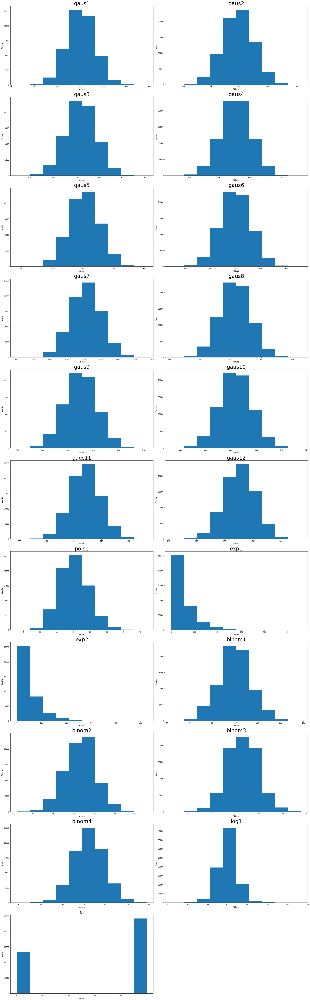

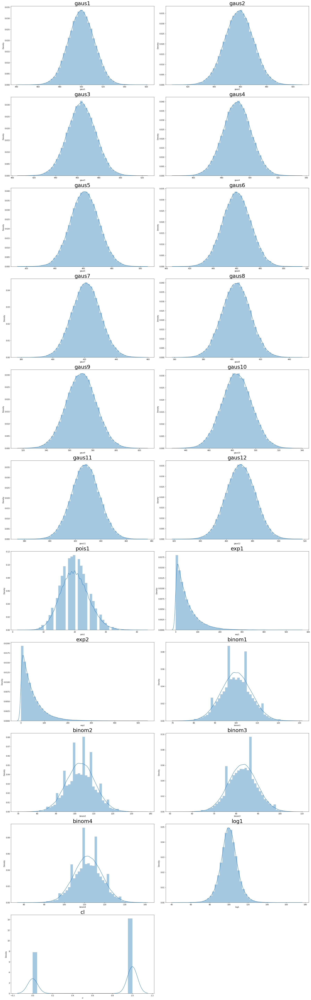

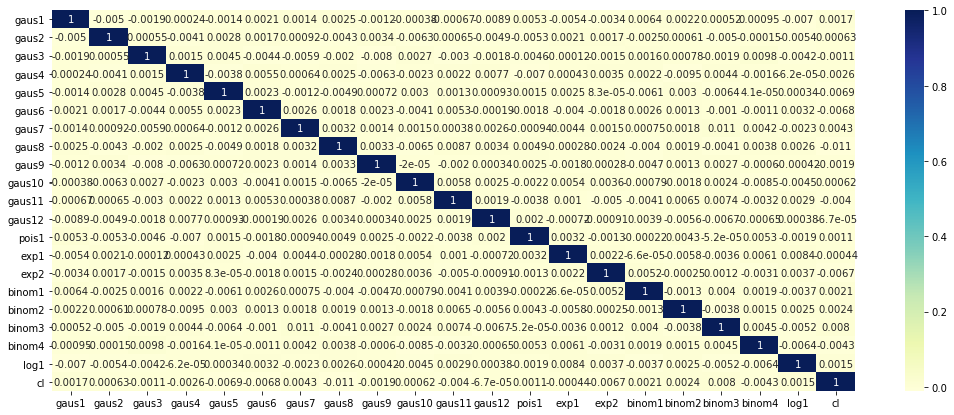

(75000, 21)
(75000, 20)
(75000,)


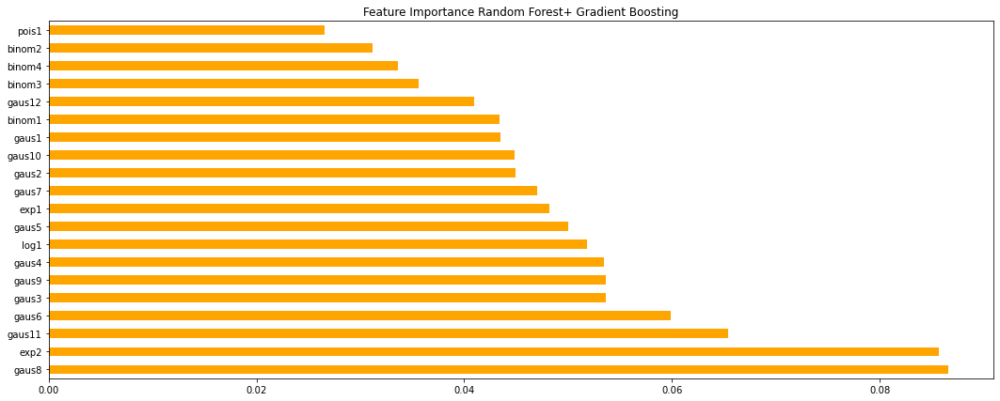

Index(['gaus8', 'exp2', 'gaus11', 'gaus6', 'gaus3', 'gaus9', 'gaus4', 'log1',
       'gaus5', 'exp1', 'cl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Logistic   Fitting Time Duration - 0.1309
Model: Logistic   predicting Time Duration - 0.0035
Model: Logistic   predicting-y Time Duration - 0.0030
Logistic  AUC ROC score :  0.5039741079164299
{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 8085}, '1': {'precision': 0.6406666666666667, 'recall': 1.0, 'f1-score': 0.7809833401056482, 'support': 14415}, 'accuracy': 0.6406666666666667, 'macro avg': {'precision': 0.32033333333333336, 'recall': 0.5, 'f1-score': 0.3904916700528241, 'support': 22500}, 'weighted avg': {'precision': 0.4104537777777778, 'recall': 0.6406666666666667, 'f1-score': 0.5003499932276853, 'support': 22500}}
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000      8085
           1   0.640667  1.000000  0.780983     14415

    accuracy  

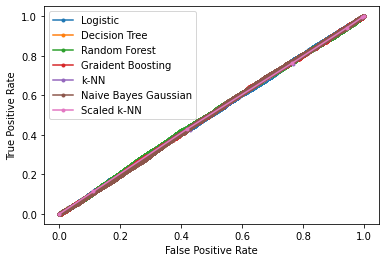

In [67]:
results_0 = data_models(df_1,'data_1','0%')

## Note:

#### Due to randomness of generated dataset there is very small correlation bewteen features and target class

In [14]:
results_0

,data_name,percent_change,model_details,fit_time,predict_y_time,predict_prob,0_precission,0_recall,0_f1,1_precsiiom,1_recall,1_f1,accuracy,auc,md_auc
0,data_1,0%,Logistic,0.1181,0.0021,0.0024,0.000000,0.000000,0.000000,0.650978,1.000000,0.788597,0.650978,0.500000,0.497469
1,data_1,0%,Decision Tree,0.3540,0.0043,0.0031,0.236842,0.002292,0.004540,0.650598,0.996040,0.787084,0.649200,0.499166,0.497323
2,data_1,0%,Random Forest,3.2947,0.0529,0.0669,0.000000,0.000000,0.000000,0.650978,1.000000,0.788597,0.650978,0.500000,0.498988
3,data_1,0%,Graident Boosting,6.6984,0.0092,0.0096,0.333333,0.000127,0.000255,0.650976,0.999863,0.788553,0.650933,0.499995,0.501174
4,data_1,0%,k-NN,0.1145,5.3847,4.8207,0.343732,0.232905,0.277668,0.649339,0.761589,0.700999,0.577067,0.497247,0.497981
5,data_1,0%,Naive Bayes Gaussian,0.0119,0.0056,0.0062,0.000000,0.000000,0.000000,0.650978,1.000000,0.788597,0.650978,0.500000,0.503419
6,data_1,0%,Scaled k-NN,0.1405,7.8549,7.1584,0.351852,0.234687,0.281567,0.651836,0.768212,0.705256,0.582000,0.501450,0.498016


## Data set 5% incremental change in pd parameters

In [ ]:
df_1_5incr=data_1.change_dataframe_incr(5)

df_1_5incr.head()

The old mu value is : 433 new chnaged mu value is : 454
The old sigma value is : 13 new chnaged sigma value is : 13
gaus6
6
The old mu value is : 493 new chnaged mu value is : 517
The old sigma value is : 13 new chnaged sigma value is : 13
gaus7
7
The old mu value is : 440 new chnaged mu value is : 462
The old sigma value is : 11 new chnaged sigma value is : 11
gaus3
3
The old beta value is : 59 new chnaged beta value is : 61
exp2
The old mu value is : 559 new chnaged mu value is : 586
The old sigma value is : 9 new chnaged sigma value is : 9
gaus4
4
The old mu value is : 594 new chnaged mu value is : 623
The old sigma value is : 13 new chnaged sigma value is : 13
gaus8
8


,gaus1,gaus2,gaus3,gaus4,gaus5,gaus6,gaus7,gaus8,gaus9,gaus10,...,gaus12,pois1,exp1,exp2,binom1,binom2,binom3,binom4,log1,cl
0,498.788375,427.655852,452.970392,599.827400,534.447744,436.327393,484.626990,624.994593,478.937577,482.378780,...,479.272509,23,0.121846,30.943280,76,122,93,100,95.927392,1
1,501.952202,406.471339,477.697906,581.419554,534.453581,454.601815,534.747850,606.644542,447.909054,452.131082,...,477.431514,22,116.096216,20.449579,93,125,109,96,93.124473,1
2,505.497376,406.820134,462.696107,572.759676,551.719926,459.482277,490.282358,621.720020,459.708456,470.501090,...,473.209064,23,8.663616,71.924576,95,135,80,107,99.733309,1
3,518.109415,409.896424,466.921782,595.112022,551.665247,451.937310,508.278181,640.035247,471.149251,473.963685,...,481.769641,22,22.666267,78.384599,111,107,102,96,120.479206,0
4,502.290110,416.484319,470.973212,587.469054,534.454453,469.339098,518.148676,639.335077,433.738111,463.970607,...,494.020159,20,145.528940,95.977721,95,133,102,89,97.511312,1


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75000 entries, 0 to 74999
Data columns (total 21 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   gaus1   75000 non-null  float64
 1   gaus2   75000 non-null  float64
 2   gaus3   75000 non-null  float64
 3   gaus4   75000 non-null  float64
 4   gaus5   75000 non-null  float64
 5   gaus6   75000 non-null  float64
 6   gaus7   75000 non-null  float64
 7   gaus8   75000 non-null  float64
 8   gaus9   75000 non-null  float64
 9   gaus10  75000 non-null  float64
 10  gaus11  75000 non-null  float64
 11  gaus12  75000 non-null  float64
 12  pois1   75000 non-null  int32  
 13  exp1    75000 non-null  float64
 14  exp2    75000 non-null  float64
 15  binom1  75000 non-null  int32  
 16  binom2  75000 non-null  int32  
 17  binom3  75000 non-null  int32  
 18  binom4  75000 non-null  int32  
 19  log1    75000 non-null  float64
 20  cl      75000 non-null  int32  
dtypes: float64(15), int32(6)
memory usa

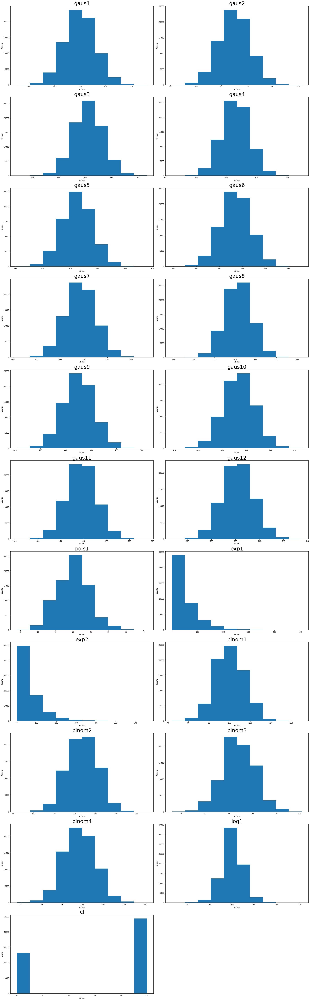

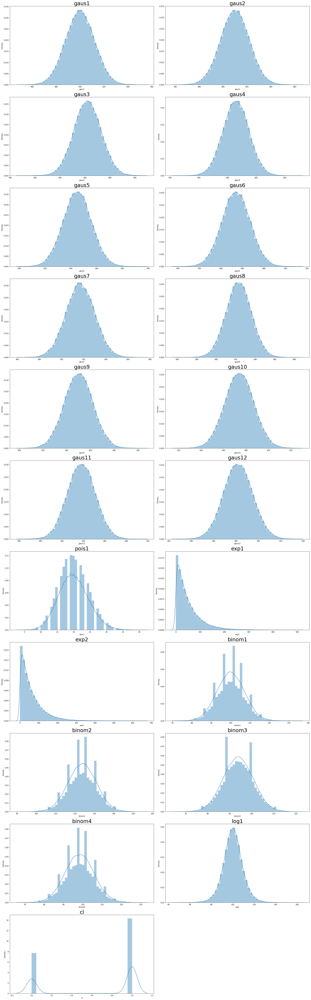

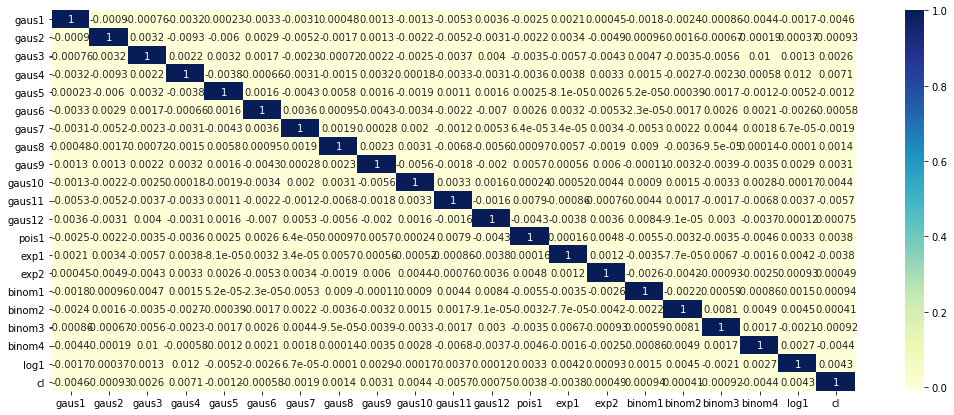

(75000, 21)
(75000, 20)
(75000,)


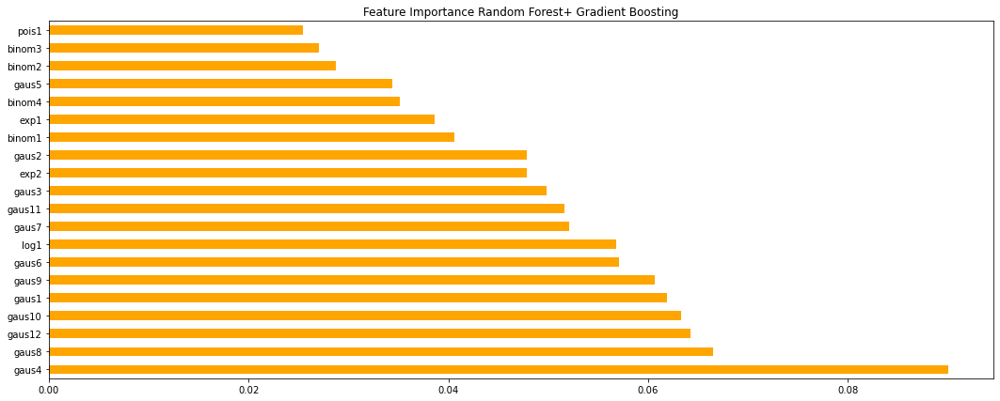

Index(['gaus4', 'gaus8', 'gaus12', 'gaus10', 'gaus1', 'gaus9', 'gaus6', 'log1',
       'gaus7', 'gaus11', 'cl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Logistic   Fitting Time Duration - 0.0822
Model: Logistic   predicting Time Duration - 0.0022
Model: Logistic   predicting-y Time Duration - 0.0018
Logistic  AUC ROC score :  0.4987286661052538
{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 7853}, '1': {'precision': 0.6509777777777778, 'recall': 1.0, 'f1-score': 0.7885966565267719, 'support': 14647}, 'accuracy': 0.6509777777777778, 'macro avg': {'precision': 0.3254888888888889, 'recall': 0.5, 'f1-score': 0.39429832826338596, 'support': 22500}, 'weighted avg': {'precision': 0.4237720671604938, 'recall': 0.6509777777777778, 'f1-score': 0.5133588990287835, 'support': 22500}}
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000      7853
           1   0.650978  1.000000  0.788597     14647

    accura

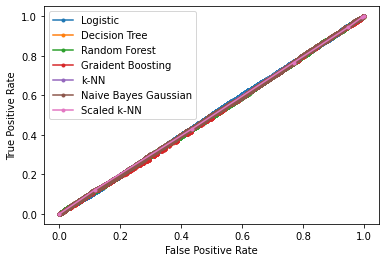

In [15]:
results_5incr = data_models(df_1_5incr,'data_1','5% incr')

In [16]:
results_5incr

,data_name,percent_change,model_details,fit_time,predict_y_time,predict_prob,0_precission,0_recall,0_f1,1_precsiiom,1_recall,1_f1,accuracy,auc,md_auc
0,data_1,0%,Logistic,0.1181,0.0021,0.0024,0.000000,0.000000,0.000000,0.650978,1.000000,0.788597,0.650978,0.500000,0.497469
1,data_1,0%,Decision Tree,0.3540,0.0043,0.0031,0.236842,0.002292,0.004540,0.650598,0.996040,0.787084,0.649200,0.499166,0.497323
2,data_1,0%,Random Forest,3.2947,0.0529,0.0669,0.000000,0.000000,0.000000,0.650978,1.000000,0.788597,0.650978,0.500000,0.498988
3,data_1,0%,Graident Boosting,6.6984,0.0092,0.0096,0.333333,0.000127,0.000255,0.650976,0.999863,0.788553,0.650933,0.499995,0.501174
4,data_1,0%,k-NN,0.1145,5.3847,4.8207,0.343732,0.232905,0.277668,0.649339,0.761589,0.700999,0.577067,0.497247,0.497981
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9,data_1,5% incr,Random Forest,2.9088,0.0508,0.0574,0.333333,0.000127,0.000255,0.650976,0.999863,0.788553,0.650933,0.499995,0.495128
10,data_1,5% incr,Graident Boosting,5.4446,0.0096,0.0086,0.500000,0.000891,0.001780,0.651072,0.999522,0.788517,0.650978,0.500207,0.491542
11,data_1,5% incr,k-NN,0.1185,7.4497,6.5561,0.354119,0.234305,0.282014,0.652508,0.770875,0.706770,0.583600,0.502590,0.501451
12,data_1,5% incr,Naive Bayes Gaussian,0.0132,0.0054,0.0055,0.000000,0.000000,0.000000,0.650978,1.000000,0.788597,0.650978,0.500000,0.498280


In [33]:
results_sorted = results.sort_values("md_auc", ascending=False)

## Result with decremental change in dataset parameters

In [ ]:
c =range(5,55,5)
c
dfs=[]
for k in c:
    w= data_1.change_dataframe_decr(k)
    dfs.append(w)
    print(k)
    res_decr = data_models(w,'data_1',str(k)+'% decr')

## Result with Incremental change in dataset parameters

The old mu value is : 570 new chnaged mu value is : 598
The old sigma value is : 13 new chnaged sigma value is : 13
gaus9
9
The old mu value is : 500 new chnaged mu value is : 525
The old sigma value is : 12 new chnaged sigma value is : 12
gaus10
1
The old lamd value is : 20 new chnaged lamd value is : 21
pois1
The old mu value is : 403 new chnaged mu value is : 423
The old sigma value is : 10 new chnaged sigma value is : 10
gaus8
8
The old beta value is : 50 new chnaged beta value is : 52
exp1
The old beta value is : 47 new chnaged beta value is : 49
exp2
5
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75000 entries, 0 to 74999
Data columns (total 21 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   gaus1   75000 non-null  float64
 1   gaus2   75000 non-null  float64
 2   gaus3   75000 non-null  float64
 3   gaus4   75000 non-null  float64
 4   gaus5   75000 non-null  float64
 5   gaus6   75000 non-null  float64
 6   gaus7   75000 non-null  f

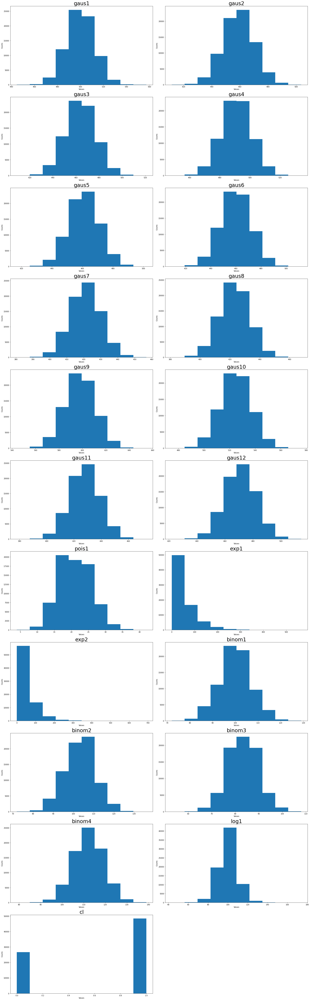

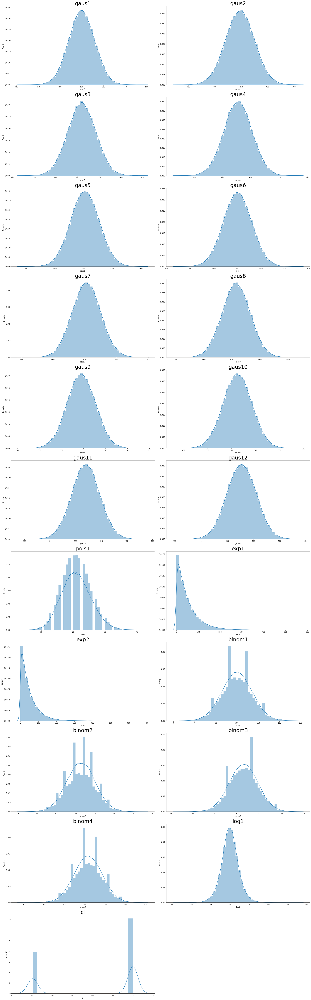

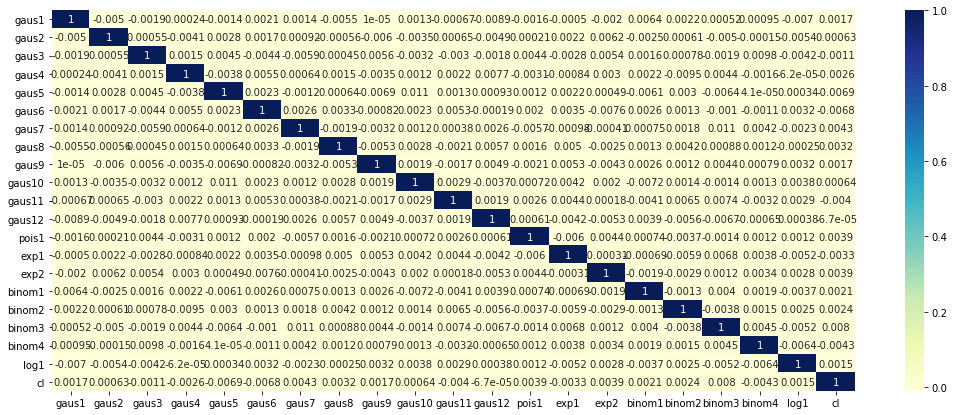

(75000, 21)
(75000, 20)
(75000,)


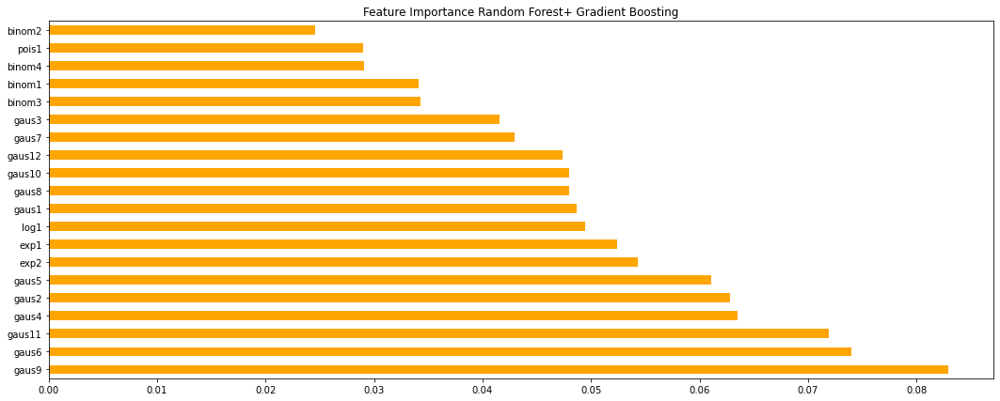

Index(['gaus9', 'gaus6', 'gaus11', 'gaus4', 'gaus2', 'gaus5', 'exp2', 'exp1',
       'log1', 'gaus1', 'cl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Logistic   Fitting Time Duration - 0.0761
Model: Logistic   predicting Time Duration - 0.0021
Model: Logistic   predicting-y Time Duration - 0.0016
Logistic  AUC ROC score :  0.4995861908601614
{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 8085}, '1': {'precision': 0.6406666666666667, 'recall': 1.0, 'f1-score': 0.7809833401056482, 'support': 14415}, 'accuracy': 0.6406666666666667, 'macro avg': {'precision': 0.32033333333333336, 'recall': 0.5, 'f1-score': 0.3904916700528241, 'support': 22500}, 'weighted avg': {'precision': 0.4104537777777778, 'recall': 0.6406666666666667, 'f1-score': 0.5003499932276853, 'support': 22500}}
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000      8085
           1   0.640667  1.000000  0.780983     14415

    accuracy  

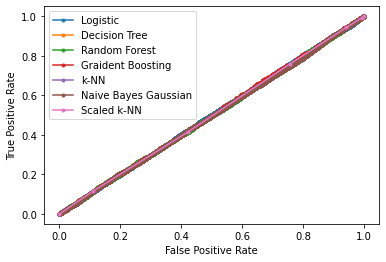

The old mu value is : 491 new chnaged mu value is : 540
The old sigma value is : 10 new chnaged sigma value is : 11
gaus4
4
The old mu value is : 570 new chnaged mu value is : 627
The old sigma value is : 13 new chnaged sigma value is : 14
gaus9
9
The old mu value is : 500 new chnaged mu value is : 550
The old sigma value is : 12 new chnaged sigma value is : 13
gaus10
1
The old mu value is : 461 new chnaged mu value is : 507
The old sigma value is : 10 new chnaged sigma value is : 11
gaus5
5
The old number_of_trials value is : 196 new chnaged number_of_trials value is : 215
The old prob_of_success_of_trial value is : 0.57 new chnaged prob_of_success_of_trial value is : 0.627
binom4
The old mu value is : 460 new chnaged mu value is : 506
The old sigma value is : 12 new chnaged sigma value is : 13
gaus6
6
10
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75000 entries, 0 to 74999
Data columns (total 21 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  

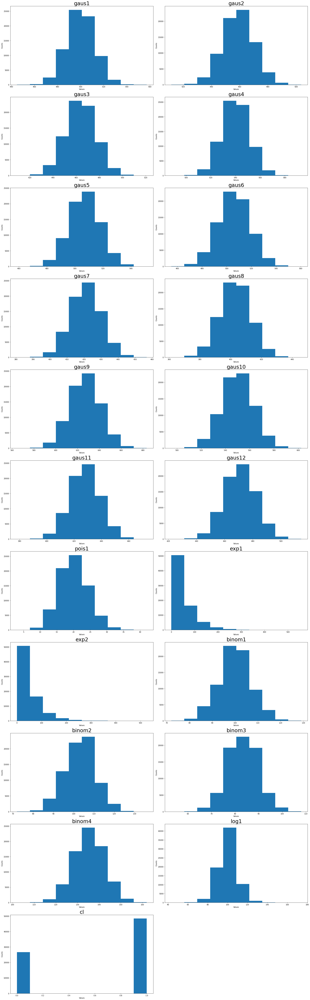

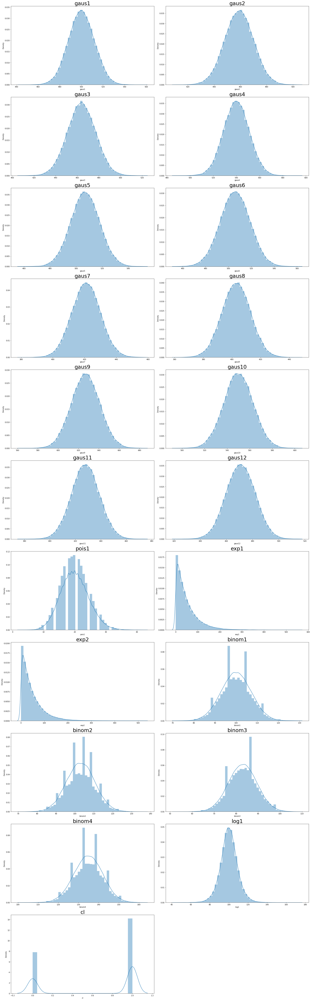

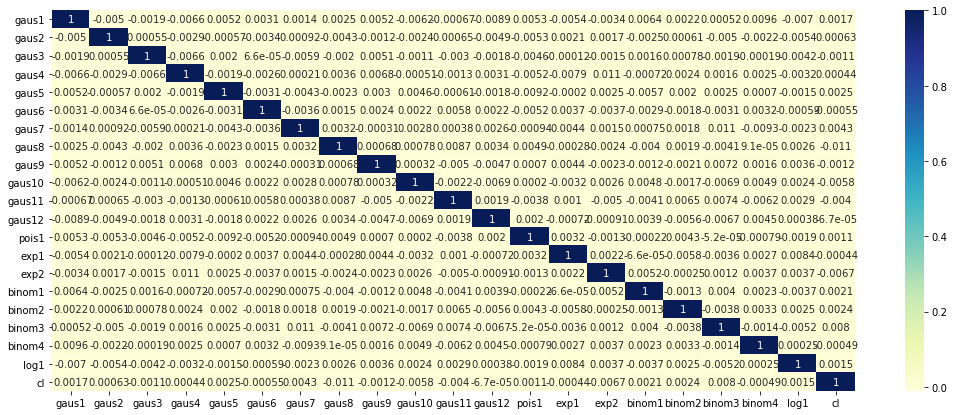

(75000, 21)
(75000, 20)
(75000,)


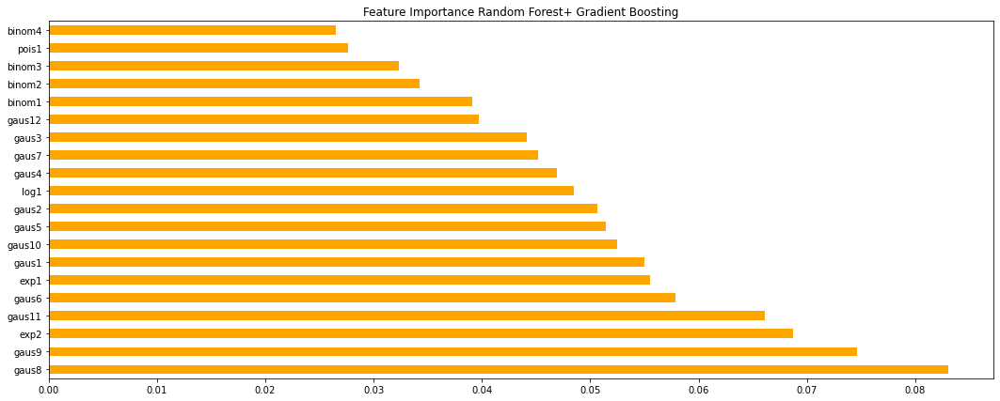

Index(['gaus8', 'gaus9', 'exp2', 'gaus11', 'gaus6', 'exp1', 'gaus1', 'gaus10',
       'gaus5', 'gaus2', 'cl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Logistic   Fitting Time Duration - 0.0984
Model: Logistic   predicting Time Duration - 0.0021
Model: Logistic   predicting-y Time Duration - 0.0017
Logistic  AUC ROC score :  0.5037092151526521
{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 8085}, '1': {'precision': 0.6406666666666667, 'recall': 1.0, 'f1-score': 0.7809833401056482, 'support': 14415}, 'accuracy': 0.6406666666666667, 'macro avg': {'precision': 0.32033333333333336, 'recall': 0.5, 'f1-score': 0.3904916700528241, 'support': 22500}, 'weighted avg': {'precision': 0.4104537777777778, 'recall': 0.6406666666666667, 'f1-score': 0.5003499932276853, 'support': 22500}}
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000      8085
           1   0.640667  1.000000  0.780983     14415

    accuracy

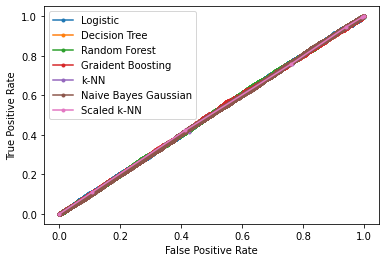

The old mu value is : 461 new chnaged mu value is : 530
The old sigma value is : 10 new chnaged sigma value is : 11
gaus5
5
The old beta value is : 47 new chnaged beta value is : 54
exp2
The old number_of_trials value is : 166 new chnaged number_of_trials value is : 190
The old prob_of_success_of_trial value is : 0.5 new chnaged prob_of_success_of_trial value is : 0.575
binom3
The old mu value is : 570 new chnaged mu value is : 655
The old sigma value is : 13 new chnaged sigma value is : 14
gaus9
9
The old lamd value is : 20 new chnaged lamd value is : 23
pois1
The old mu value is : 500 new chnaged mu value is : 575
The old sigma value is : 12 new chnaged sigma value is : 13
gaus10
1
15
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75000 entries, 0 to 74999
Data columns (total 21 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   gaus1   75000 non-null  float64
 1   gaus2   75000 non-null  float64
 2   gaus3   75000 non-null  float64
 3   gaus4

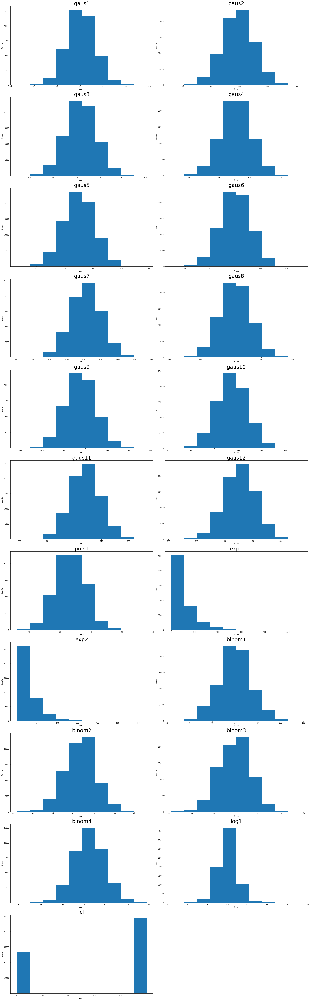

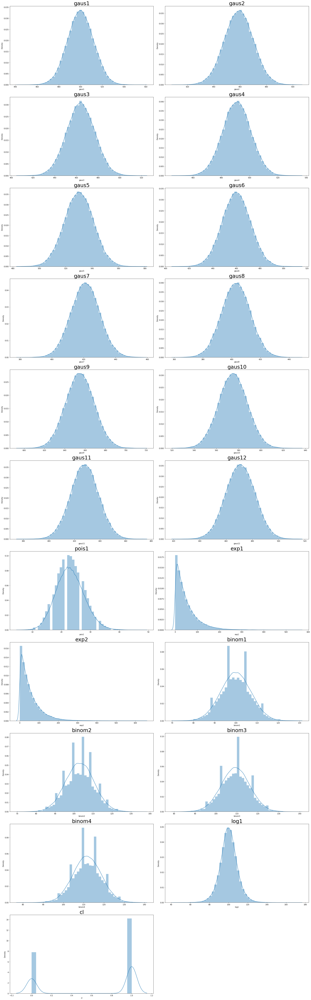

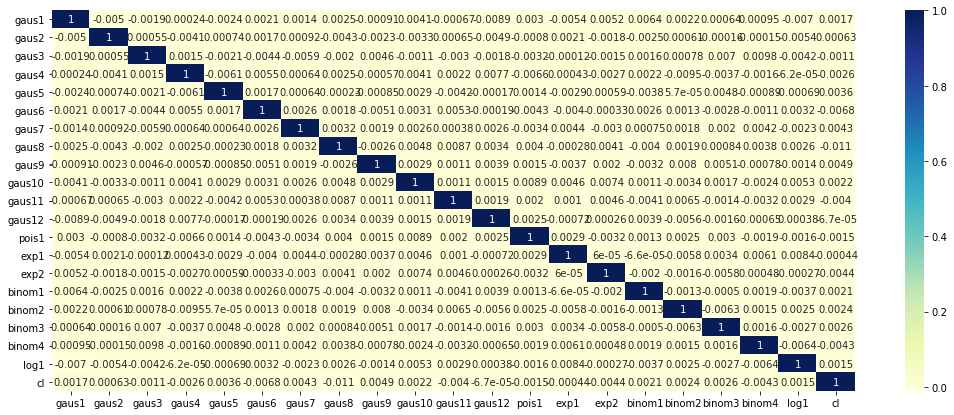

(75000, 21)
(75000, 20)
(75000,)


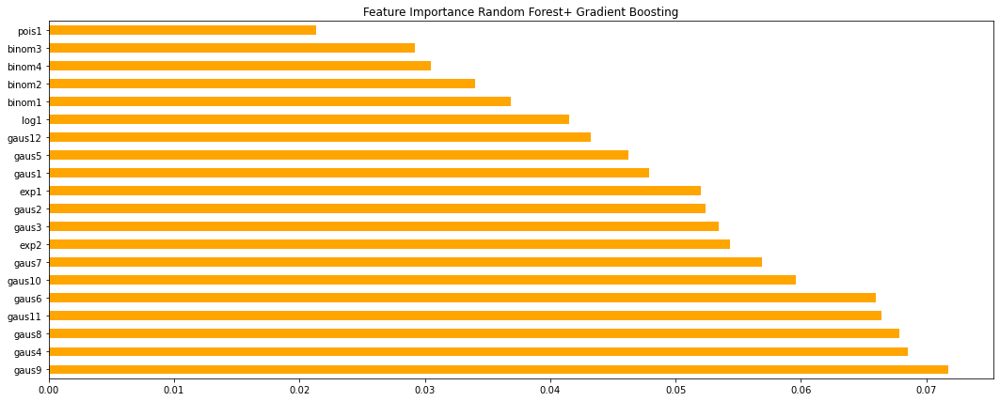

Index(['gaus9', 'gaus4', 'gaus8', 'gaus11', 'gaus6', 'gaus10', 'gaus7', 'exp2',
       'gaus3', 'gaus2', 'cl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Logistic   Fitting Time Duration - 0.1441
Model: Logistic   predicting Time Duration - 0.0023
Model: Logistic   predicting-y Time Duration - 0.0018
Logistic  AUC ROC score :  0.5046329420047273
{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 8085}, '1': {'precision': 0.6406666666666667, 'recall': 1.0, 'f1-score': 0.7809833401056482, 'support': 14415}, 'accuracy': 0.6406666666666667, 'macro avg': {'precision': 0.32033333333333336, 'recall': 0.5, 'f1-score': 0.3904916700528241, 'support': 22500}, 'weighted avg': {'precision': 0.4104537777777778, 'recall': 0.6406666666666667, 'f1-score': 0.5003499932276853, 'support': 22500}}
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000      8085
           1   0.640667  1.000000  0.780983     14415

    accurac

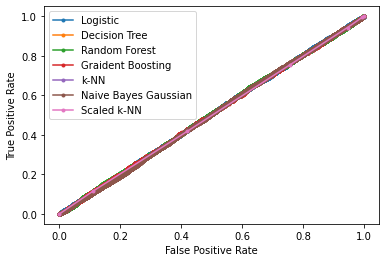

The old number_of_trials value is : 196 new chnaged number_of_trials value is : 235
The old prob_of_success_of_trial value is : 0.57 new chnaged prob_of_success_of_trial value is : 0.6839999999999999
binom4
The old mu value is : 464 new chnaged mu value is : 556
The old sigma value is : 13 new chnaged sigma value is : 15
gaus3
3
The old number_of_trials value is : 200 new chnaged number_of_trials value is : 240
The old prob_of_success_of_trial value is : 0.5 new chnaged prob_of_success_of_trial value is : 0.6
binom1
The old mu value is : 460 new chnaged mu value is : 552
The old sigma value is : 12 new chnaged sigma value is : 14
gaus6
6
The old mu value is : 403 new chnaged mu value is : 483
The old sigma value is : 10 new chnaged sigma value is : 12
gaus8
8
The old beta value is : 47 new chnaged beta value is : 56
exp2
20
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75000 entries, 0 to 74999
Data columns (total 21 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  -----

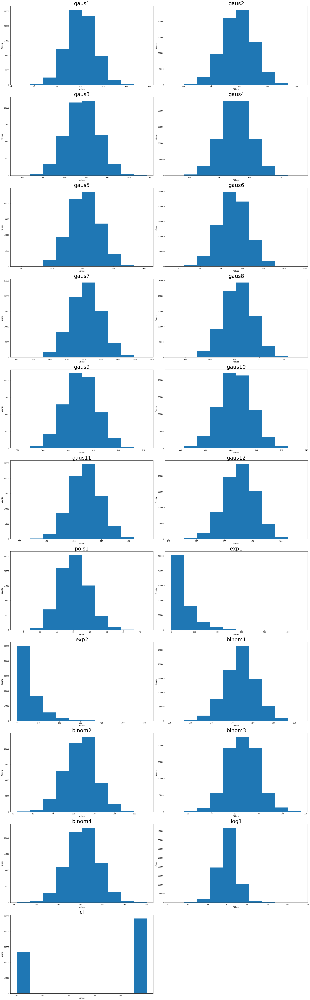

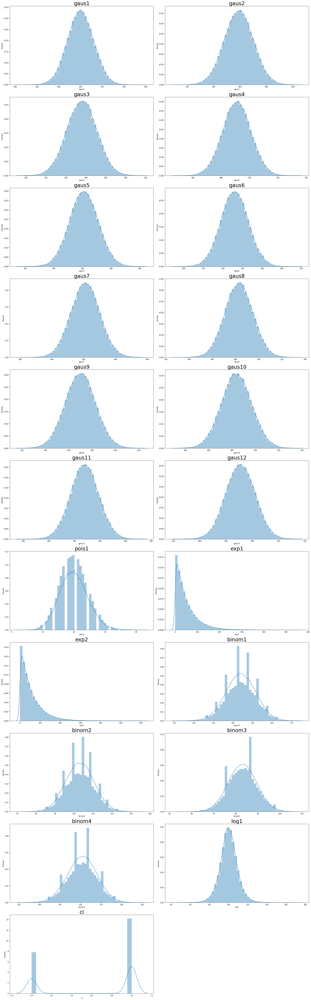

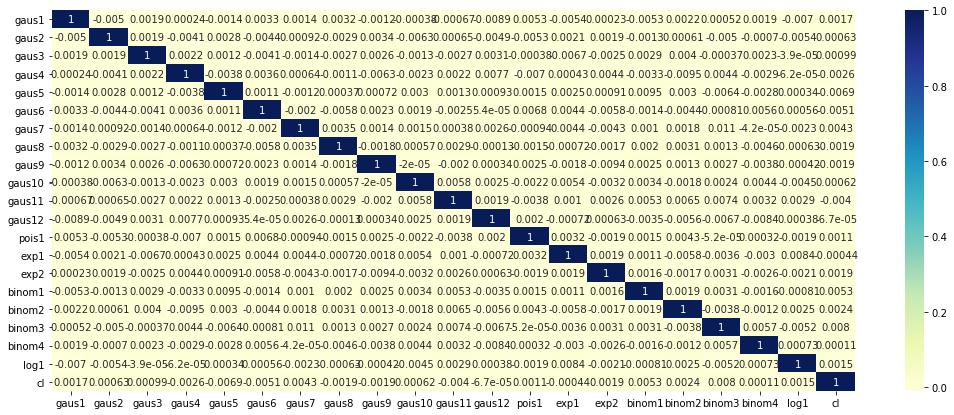

(75000, 21)
(75000, 20)
(75000,)


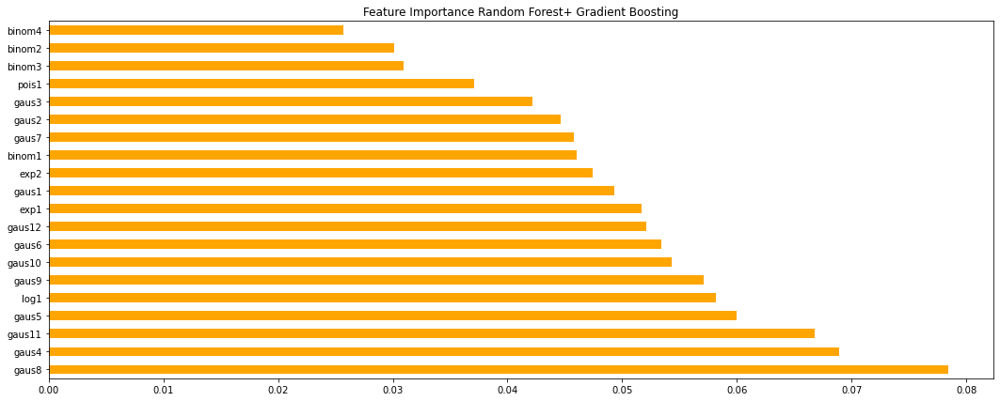

Index(['gaus8', 'gaus4', 'gaus11', 'gaus5', 'log1', 'gaus9', 'gaus10', 'gaus6',
       'gaus12', 'exp1', 'cl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Logistic   Fitting Time Duration - 0.0785
Model: Logistic   predicting Time Duration - 0.0022
Model: Logistic   predicting-y Time Duration - 0.0017
Logistic  AUC ROC score :  0.49995189423166236
{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 8085}, '1': {'precision': 0.6406666666666667, 'recall': 1.0, 'f1-score': 0.7809833401056482, 'support': 14415}, 'accuracy': 0.6406666666666667, 'macro avg': {'precision': 0.32033333333333336, 'recall': 0.5, 'f1-score': 0.3904916700528241, 'support': 22500}, 'weighted avg': {'precision': 0.4104537777777778, 'recall': 0.6406666666666667, 'f1-score': 0.5003499932276853, 'support': 22500}}
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000      8085
           1   0.640667  1.000000  0.780983     14415

    accura

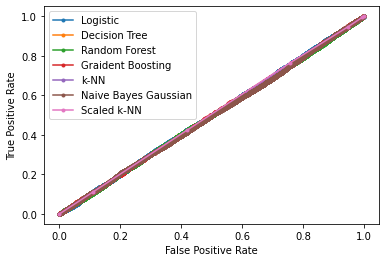

The old mu value is : 500 new chnaged mu value is : 625
The old sigma value is : 12 new chnaged sigma value is : 15
gaus11
1
The old mu value is : 491 new chnaged mu value is : 613
The old sigma value is : 10 new chnaged sigma value is : 12
gaus4
4
The old mu value is : 500 new chnaged mu value is : 625
The old sigma value is : 12 new chnaged sigma value is : 15
gaus1
1
The old number_of_trials value is : 229 new chnaged number_of_trials value is : 286
The old prob_of_success_of_trial value is : 0.45 new chnaged prob_of_success_of_trial value is : 0.5625
binom2
The old number_of_trials value is : 200 new chnaged number_of_trials value is : 250
The old prob_of_success_of_trial value is : 0.5 new chnaged prob_of_success_of_trial value is : 0.625
binom1
The old number_of_trials value is : 196 new chnaged number_of_trials value is : 245
The old prob_of_success_of_trial value is : 0.57 new chnaged prob_of_success_of_trial value is : 0.7124999999999999
binom4
25
<class 'pandas.core.frame.Dat

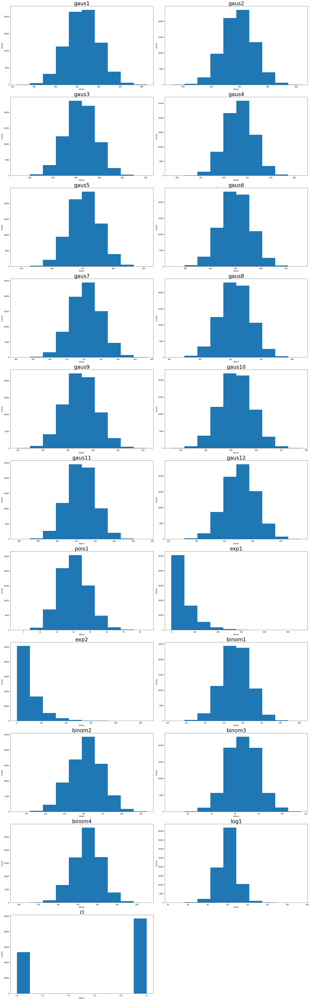

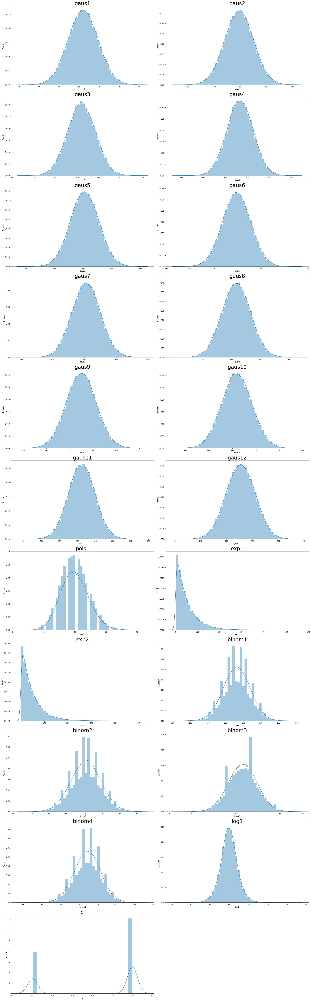

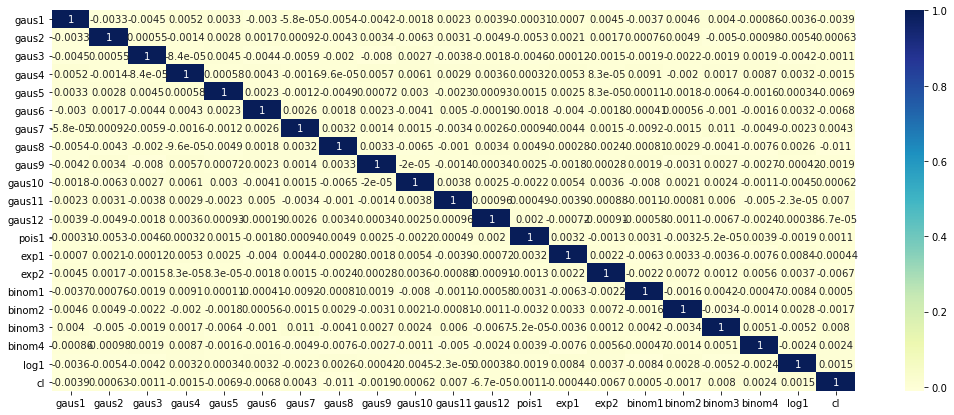

(75000, 21)
(75000, 20)
(75000,)


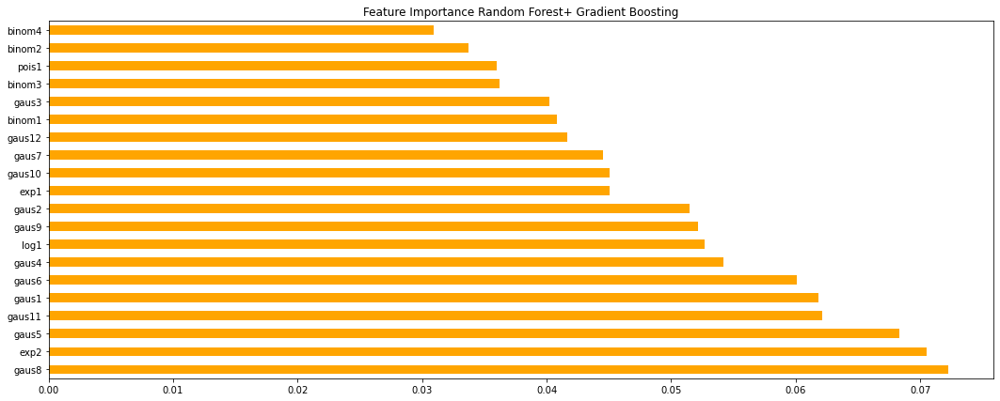

Index(['gaus8', 'exp2', 'gaus5', 'gaus11', 'gaus1', 'gaus6', 'gaus4', 'log1',
       'gaus9', 'gaus2', 'cl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Logistic   Fitting Time Duration - 0.0863
Model: Logistic   predicting Time Duration - 0.0021
Model: Logistic   predicting-y Time Duration - 0.0012
Logistic  AUC ROC score :  0.5074056241233289
{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 8085}, '1': {'precision': 0.6406666666666667, 'recall': 1.0, 'f1-score': 0.7809833401056482, 'support': 14415}, 'accuracy': 0.6406666666666667, 'macro avg': {'precision': 0.32033333333333336, 'recall': 0.5, 'f1-score': 0.3904916700528241, 'support': 22500}, 'weighted avg': {'precision': 0.4104537777777778, 'recall': 0.6406666666666667, 'f1-score': 0.5003499932276853, 'support': 22500}}
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000      8085
           1   0.640667  1.000000  0.780983     14415

    accuracy 

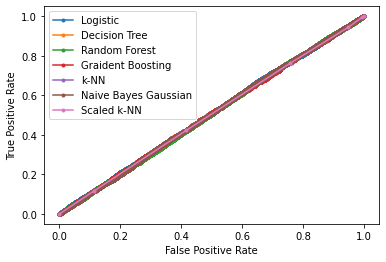

The old beta value is : 50 new chnaged beta value is : 65
exp1
The old mu value is : 464 new chnaged mu value is : 603
The old sigma value is : 13 new chnaged sigma value is : 16
gaus3
3
The old mu value is : 500 new chnaged mu value is : 650
The old sigma value is : 12 new chnaged sigma value is : 15
gaus1
1
The old mu value is : 459 new chnaged mu value is : 596
The old sigma value is : 11 new chnaged sigma value is : 14
gaus2
2
The old number_of_trials value is : 166 new chnaged number_of_trials value is : 215
The old prob_of_success_of_trial value is : 0.5 new chnaged prob_of_success_of_trial value is : 0.65
binom3
The old lamd value is : 20 new chnaged lamd value is : 26
pois1
30
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75000 entries, 0 to 74999
Data columns (total 21 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   gaus1   75000 non-null  float64
 1   gaus2   75000 non-null  float64
 2   gaus3   75000 non-null  float64
 3   gaus4  

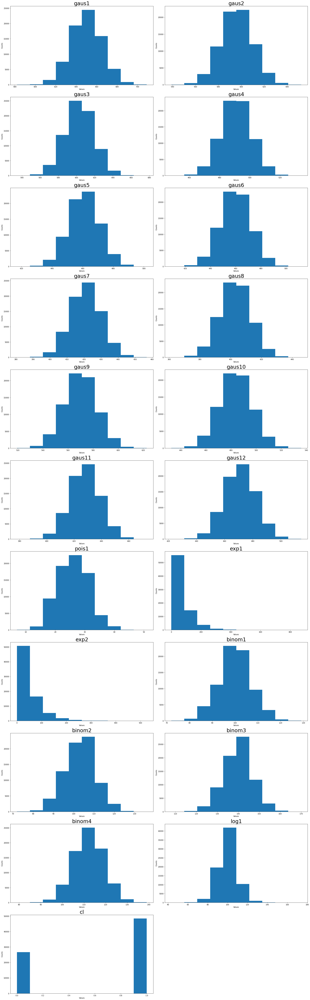

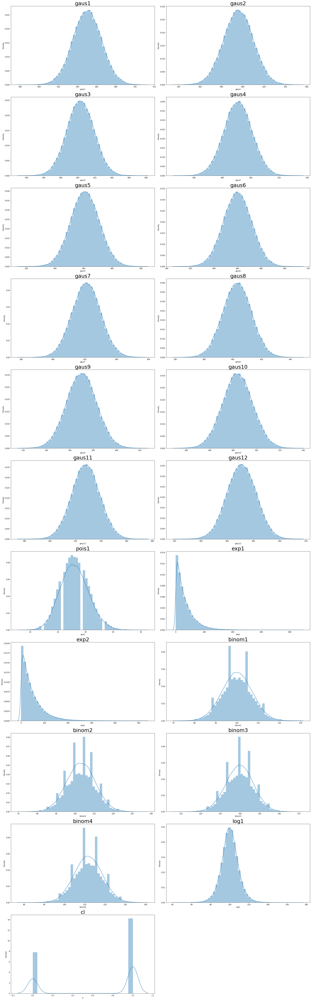

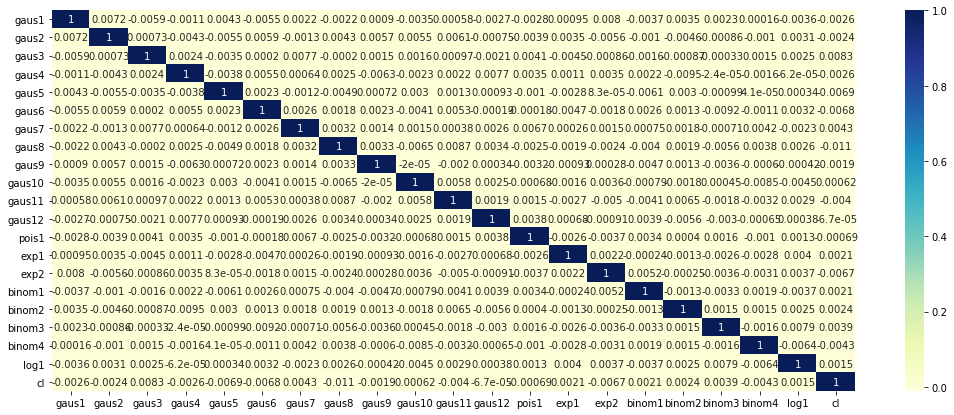

(75000, 21)
(75000, 20)
(75000,)


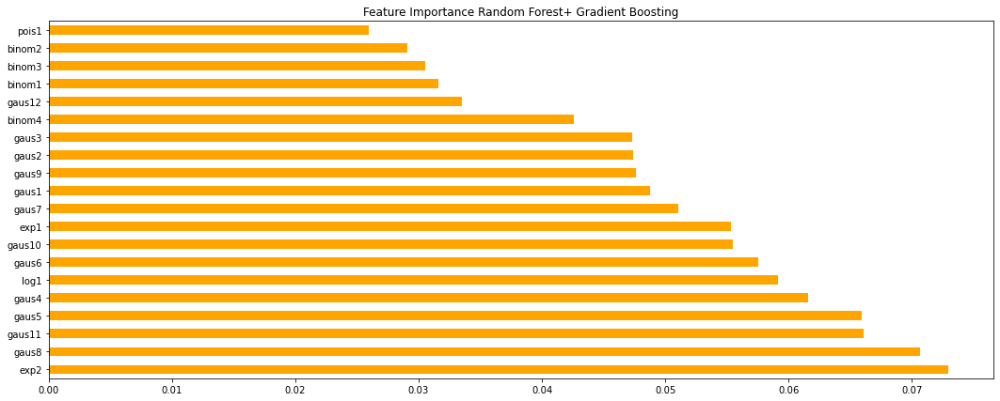

Index(['exp2', 'gaus8', 'gaus11', 'gaus5', 'gaus4', 'log1', 'gaus6', 'gaus10',
       'exp1', 'gaus7', 'cl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Logistic   Fitting Time Duration - 0.0936
Model: Logistic   predicting Time Duration - 0.0016
Model: Logistic   predicting-y Time Duration - 0.0013
Logistic  AUC ROC score :  0.508725857826497
{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 8085}, '1': {'precision': 0.6406666666666667, 'recall': 1.0, 'f1-score': 0.7809833401056482, 'support': 14415}, 'accuracy': 0.6406666666666667, 'macro avg': {'precision': 0.32033333333333336, 'recall': 0.5, 'f1-score': 0.3904916700528241, 'support': 22500}, 'weighted avg': {'precision': 0.4104537777777778, 'recall': 0.6406666666666667, 'f1-score': 0.5003499932276853, 'support': 22500}}
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000      8085
           1   0.640667  1.000000  0.780983     14415

    accuracy  

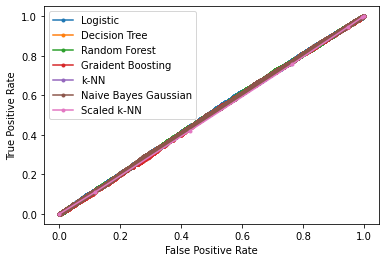

The old mu value is : 421 new chnaged mu value is : 568
The old sigma value is : 9 new chnaged sigma value is : 12
gaus7
7
The old number_of_trials value is : 200 new chnaged number_of_trials value is : 270
The old prob_of_success_of_trial value is : 0.5 new chnaged prob_of_success_of_trial value is : 0.675
binom1
The old lamd value is : 20 new chnaged lamd value is : 27
pois1
The old mu value is : 570 new chnaged mu value is : 769
The old sigma value is : 13 new chnaged sigma value is : 17
gaus9
9
The old mu value is : 464 new chnaged mu value is : 626
The old sigma value is : 13 new chnaged sigma value is : 17
gaus3
3
The old mu value is : 500 new chnaged mu value is : 675
The old sigma value is : 12 new chnaged sigma value is : 16
gaus11
1
35
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75000 entries, 0 to 74999
Data columns (total 21 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   gaus1   75000 non-null  float64
 1   gaus2   75000 non-n

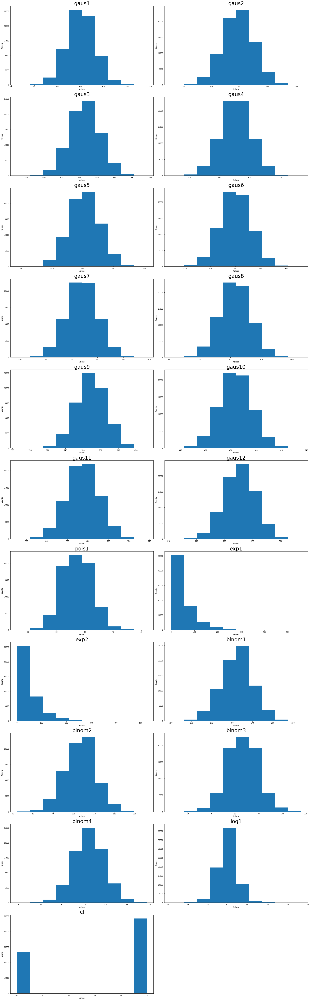

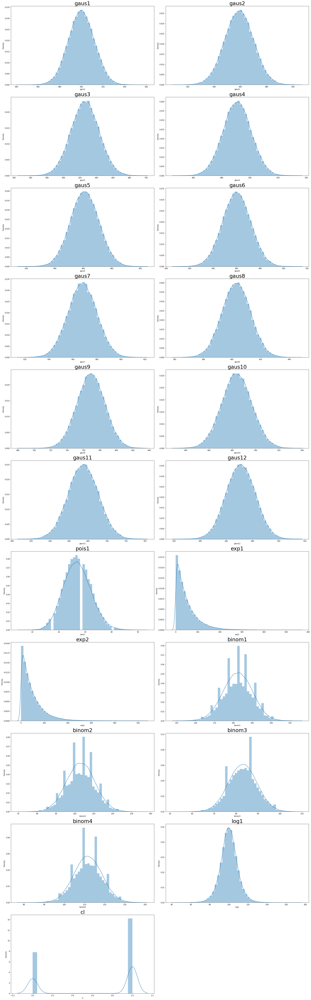

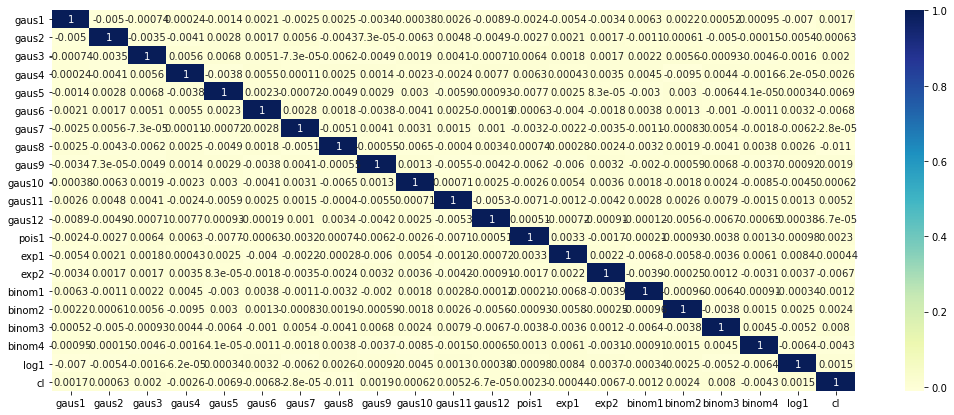

(75000, 21)
(75000, 20)
(75000,)


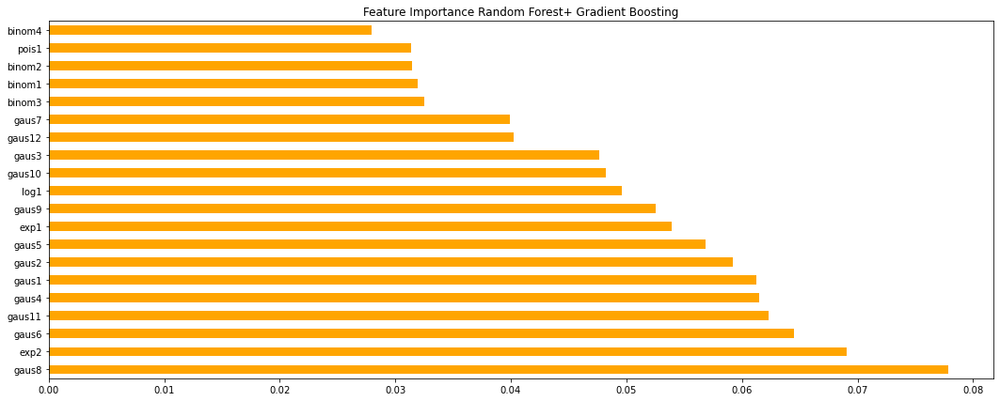

Index(['gaus8', 'exp2', 'gaus6', 'gaus11', 'gaus4', 'gaus1', 'gaus2', 'gaus5',
       'exp1', 'gaus9', 'cl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Logistic   Fitting Time Duration - 0.0922
Model: Logistic   predicting Time Duration - 0.0028
Model: Logistic   predicting-y Time Duration - 0.0016
Logistic  AUC ROC score :  0.5060013286681935
{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 8085}, '1': {'precision': 0.6406666666666667, 'recall': 1.0, 'f1-score': 0.7809833401056482, 'support': 14415}, 'accuracy': 0.6406666666666667, 'macro avg': {'precision': 0.32033333333333336, 'recall': 0.5, 'f1-score': 0.3904916700528241, 'support': 22500}, 'weighted avg': {'precision': 0.4104537777777778, 'recall': 0.6406666666666667, 'f1-score': 0.5003499932276853, 'support': 22500}}
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000      8085
           1   0.640667  1.000000  0.780983     14415

    accuracy 

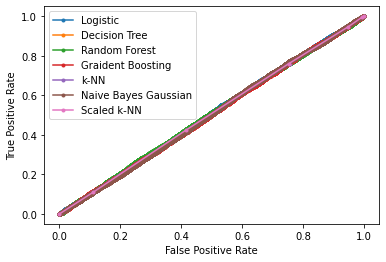

The old beta value is : 50 new chnaged beta value is : 70
exp1
The old mu value is : 500 new chnaged mu value is : 700
The old sigma value is : 12 new chnaged sigma value is : 16
gaus10
1
The old mu value is : 403 new chnaged mu value is : 564
The old sigma value is : 10 new chnaged sigma value is : 14
gaus8
8
The old mu value is : 491 new chnaged mu value is : 687
The old sigma value is : 10 new chnaged sigma value is : 14
gaus4
4
The old mu value is : 460 new chnaged mu value is : 644
The old sigma value is : 12 new chnaged sigma value is : 16
gaus6
6
The old mu value is : 500 new chnaged mu value is : 700
The old sigma value is : 12 new chnaged sigma value is : 16
gaus1
1
40
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75000 entries, 0 to 74999
Data columns (total 21 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   gaus1   75000 non-null  float64
 1   gaus2   75000 non-null  float64
 2   gaus3   75000 non-null  float64
 3   gaus4   75000 

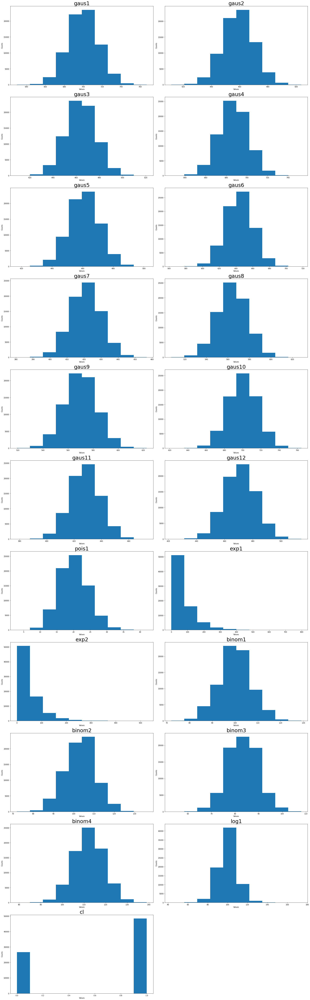

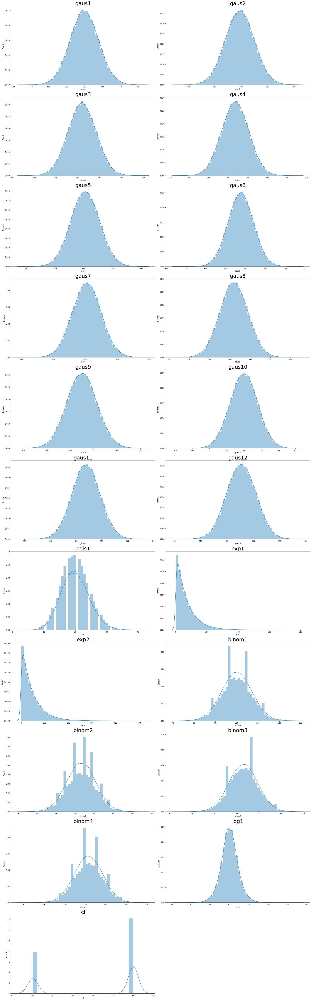

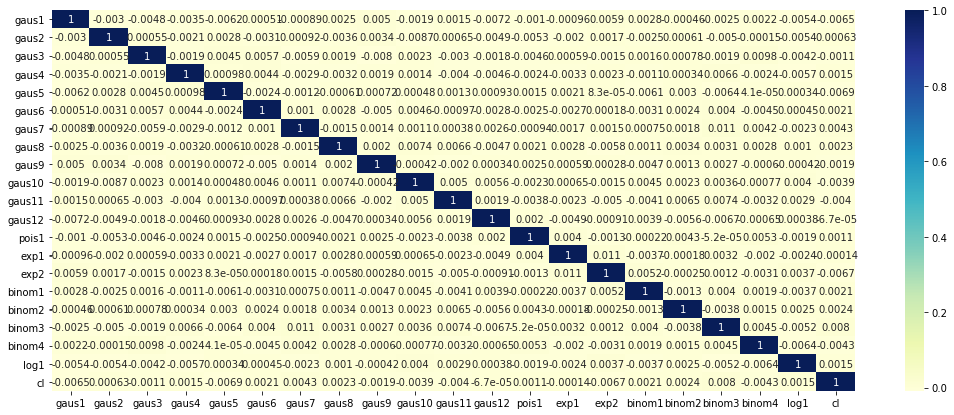

(75000, 21)
(75000, 20)
(75000,)


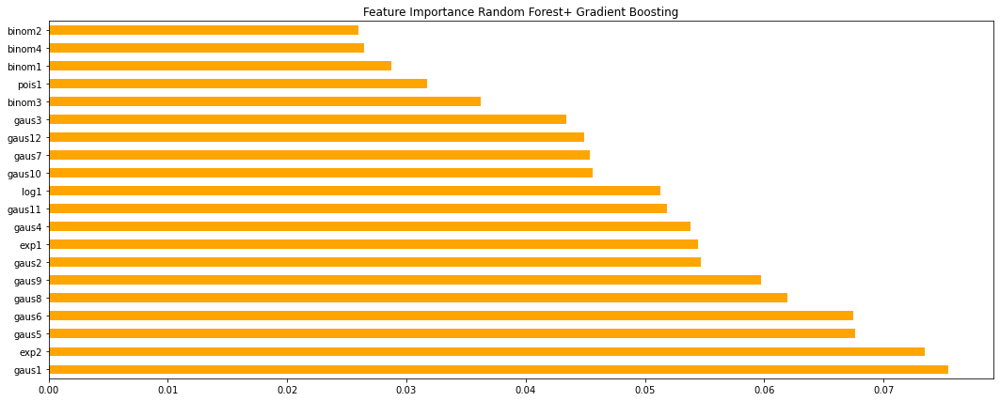

Index(['gaus1', 'exp2', 'gaus5', 'gaus6', 'gaus8', 'gaus9', 'gaus2', 'exp1',
       'gaus4', 'gaus11', 'cl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Logistic   Fitting Time Duration - 0.0860
Model: Logistic   predicting Time Duration - 0.0022
Model: Logistic   predicting-y Time Duration - 0.0014
Logistic  AUC ROC score :  0.5016462572163478
{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 8085}, '1': {'precision': 0.6406666666666667, 'recall': 1.0, 'f1-score': 0.7809833401056482, 'support': 14415}, 'accuracy': 0.6406666666666667, 'macro avg': {'precision': 0.32033333333333336, 'recall': 0.5, 'f1-score': 0.3904916700528241, 'support': 22500}, 'weighted avg': {'precision': 0.4104537777777778, 'recall': 0.6406666666666667, 'f1-score': 0.5003499932276853, 'support': 22500}}
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000      8085
           1   0.640667  1.000000  0.780983     14415

    accuracy 

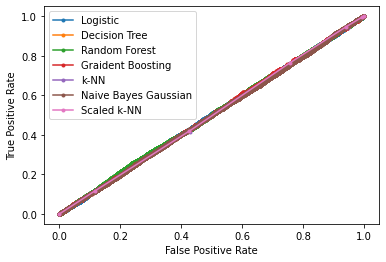

The old mu value is : 460 new chnaged mu value is : 667
The old sigma value is : 12 new chnaged sigma value is : 17
gaus6
6
The old number_of_trials value is : 196 new chnaged number_of_trials value is : 284
The old prob_of_success_of_trial value is : 0.57 new chnaged prob_of_success_of_trial value is : 0.8264999999999999
binom4
The old mu value is : 500 new chnaged mu value is : 725
The old sigma value is : 12 new chnaged sigma value is : 17
gaus1
1
The old mu value is : 500 new chnaged mu value is : 725
The old sigma value is : 12 new chnaged sigma value is : 17
gaus11
1
The old number_of_trials value is : 200 new chnaged number_of_trials value is : 290
The old prob_of_success_of_trial value is : 0.5 new chnaged prob_of_success_of_trial value is : 0.725
binom1
The old mu value is : 461 new chnaged mu value is : 668
The old sigma value is : 10 new chnaged sigma value is : 14
gaus5
5
45
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75000 entries, 0 to 74999
Data columns (total 21 c

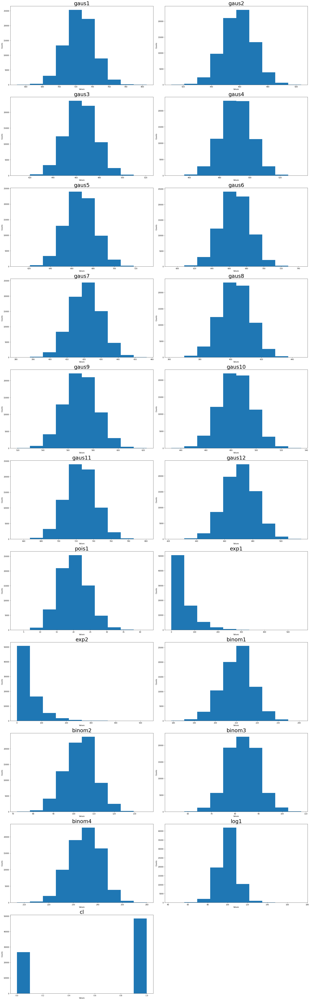

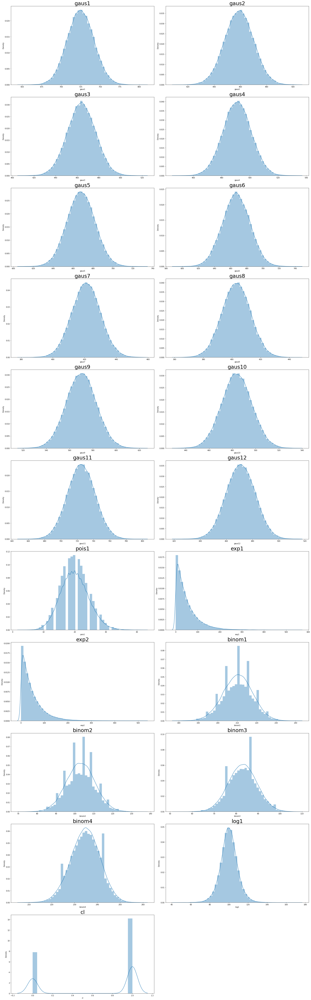

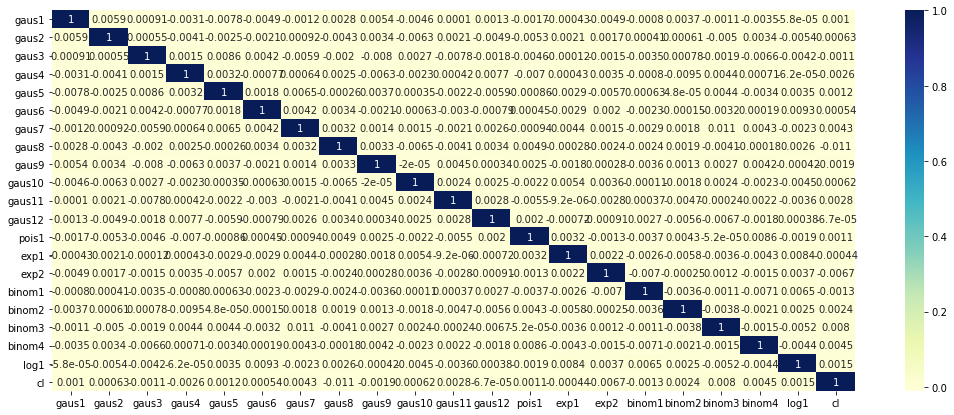

(75000, 21)
(75000, 20)
(75000,)


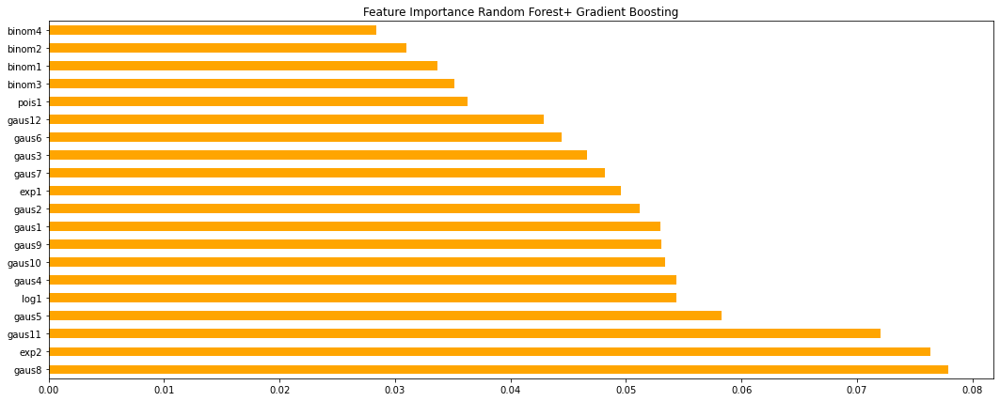

Index(['gaus8', 'exp2', 'gaus11', 'gaus5', 'log1', 'gaus4', 'gaus10', 'gaus9',
       'gaus1', 'gaus2', 'cl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Logistic   Fitting Time Duration - 0.1133
Model: Logistic   predicting Time Duration - 0.0020
Model: Logistic   predicting-y Time Duration - 0.0016
Logistic  AUC ROC score :  0.5069943075770339
{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 8085}, '1': {'precision': 0.6406666666666667, 'recall': 1.0, 'f1-score': 0.7809833401056482, 'support': 14415}, 'accuracy': 0.6406666666666667, 'macro avg': {'precision': 0.32033333333333336, 'recall': 0.5, 'f1-score': 0.3904916700528241, 'support': 22500}, 'weighted avg': {'precision': 0.4104537777777778, 'recall': 0.6406666666666667, 'f1-score': 0.5003499932276853, 'support': 22500}}
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000      8085
           1   0.640667  1.000000  0.780983     14415

    accuracy

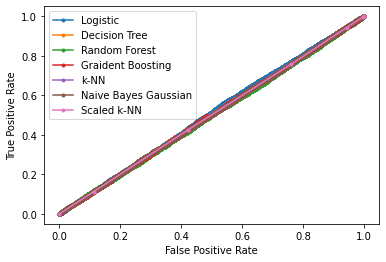

The old mu value is : 464 new chnaged mu value is : 696
The old sigma value is : 13 new chnaged sigma value is : 19
gaus3
3
The old mu value is : 421 new chnaged mu value is : 631
The old sigma value is : 9 new chnaged sigma value is : 13
gaus7
7
The old mu value is : 500 new chnaged mu value is : 750
The old sigma value is : 12 new chnaged sigma value is : 18
gaus10
1
The old mu value is : 570 new chnaged mu value is : 855
The old sigma value is : 13 new chnaged sigma value is : 19
gaus9
9
The old mu value is : 460 new chnaged mu value is : 690
The old sigma value is : 12 new chnaged sigma value is : 18
gaus6
6
The old number_of_trials value is : 166 new chnaged number_of_trials value is : 249
The old prob_of_success_of_trial value is : 0.5 new chnaged prob_of_success_of_trial value is : 0.75
binom3
50
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75000 entries, 0 to 74999
Data columns (total 21 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0

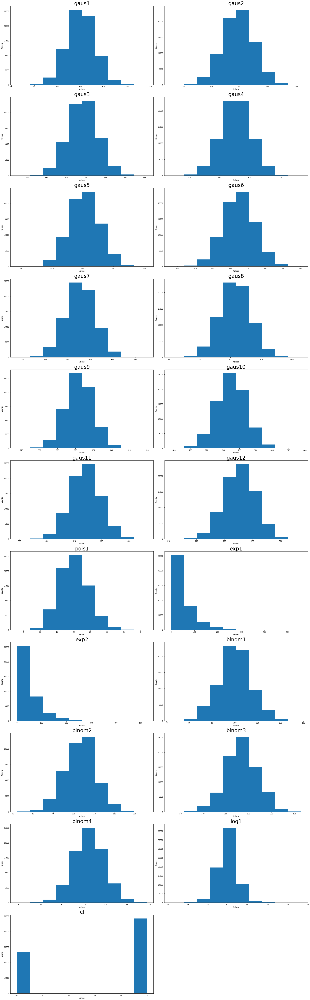

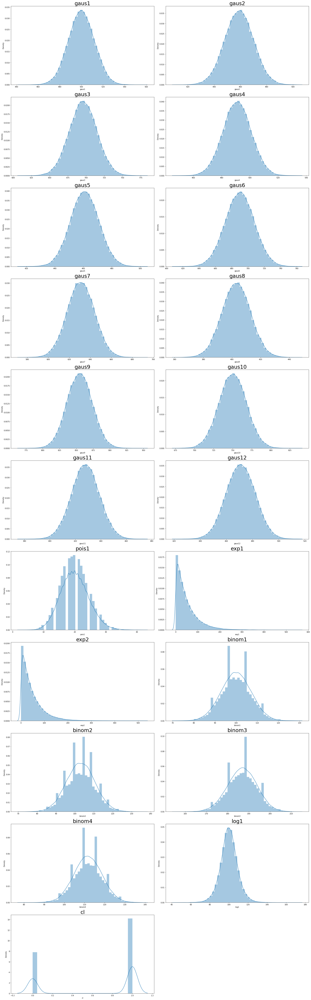

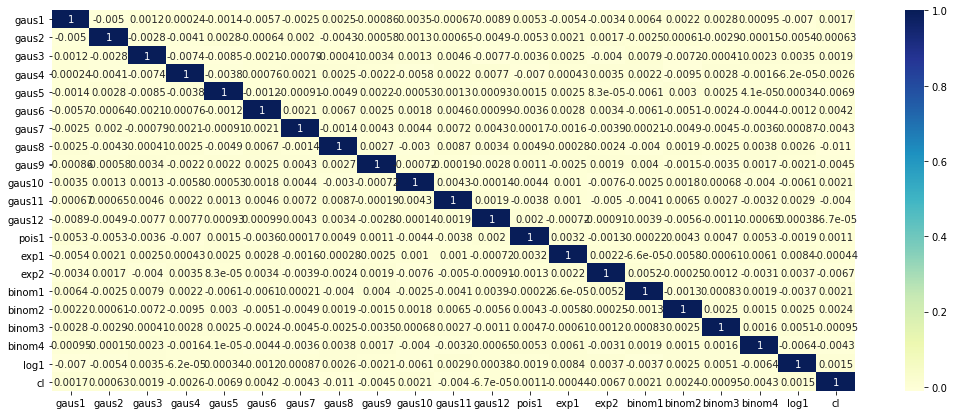

(75000, 21)
(75000, 20)
(75000,)


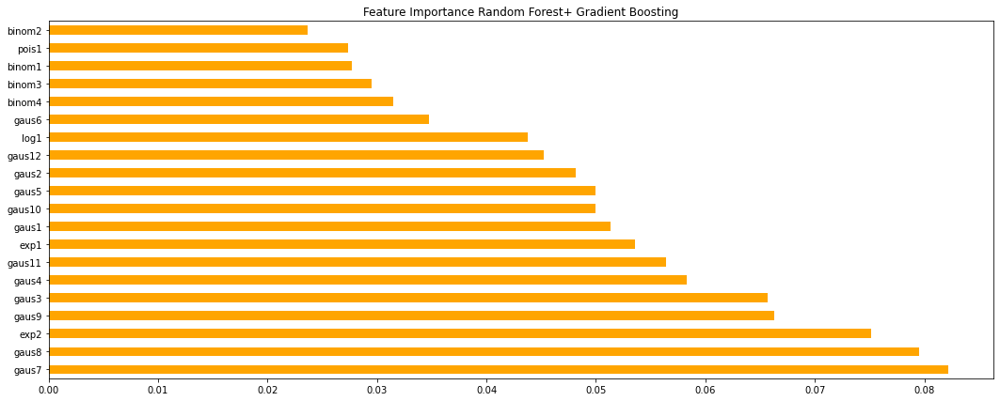

Index(['gaus7', 'gaus8', 'exp2', 'gaus9', 'gaus3', 'gaus4', 'gaus11', 'exp1',
       'gaus1', 'gaus10', 'cl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Logistic   Fitting Time Duration - 0.1022
Model: Logistic   predicting Time Duration - 0.0016
Model: Logistic   predicting-y Time Duration - 0.0014
Logistic  AUC ROC score :  0.5075330166752792
{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 8085}, '1': {'precision': 0.6406666666666667, 'recall': 1.0, 'f1-score': 0.7809833401056482, 'support': 14415}, 'accuracy': 0.6406666666666667, 'macro avg': {'precision': 0.32033333333333336, 'recall': 0.5, 'f1-score': 0.3904916700528241, 'support': 22500}, 'weighted avg': {'precision': 0.4104537777777778, 'recall': 0.6406666666666667, 'f1-score': 0.5003499932276853, 'support': 22500}}
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000      8085
           1   0.640667  1.000000  0.780983     14415

    accuracy

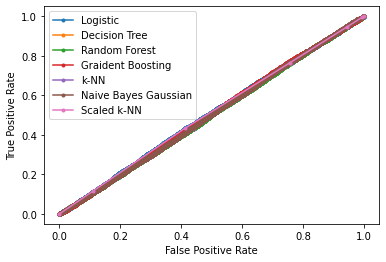

In [69]:
c =range(5,55,5)
c
dfs=[]
for k in c:
    w= data_1.change_dataframe_incr(k)
    dfs.append(w)
    print(k)
    res_incr = data_models(w,'data_1',str(k)+'% incr')

In [71]:
results = res_incr

,data_name,percent_change,model_details,fit_time,predict_y_time,predict_prob,0_precission,0_recall,0_f1,1_precsiiom,1_recall,1_f1,accuracy,auc,md_auc
0,data_1,0%,Logistic,0.1309,0.0030,0.0035,0.000000,0.000000,0.000000,0.640667,1.000000,0.780983,0.640667,0.500000,0.503974
1,data_1,0%,Decision Tree,0.3403,0.0026,0.0044,0.407407,0.001361,0.002712,0.640724,0.998890,0.780687,0.640444,0.500125,0.504446
2,data_1,0%,Random Forest,3.3467,0.0724,0.0889,0.000000,0.000000,0.000000,0.640667,1.000000,0.780983,0.640667,0.500000,0.506347
3,data_1,0%,Graident Boosting,6.7242,0.0254,0.0219,0.421053,0.000989,0.001974,0.640719,0.999237,0.780789,0.640533,0.500113,0.503717
4,data_1,0%,k-NN,0.1450,4.3902,4.5221,0.352433,0.232035,0.279833,0.638528,0.760874,0.694353,0.570844,0.496454,0.496648
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,data_1,50% decr,Random Forest,3.1550,0.0460,0.0471,0.571429,0.000495,0.000989,0.640733,0.999792,0.780969,0.640711,0.500143,0.498229
73,data_1,50% decr,Graident Boosting,5.5243,0.0088,0.0092,0.433333,0.001608,0.003204,0.640765,0.998821,0.780697,0.640489,0.500214,0.498141
74,data_1,50% decr,k-NN,0.1110,2.8134,2.4158,0.350890,0.238961,0.284306,0.637931,0.752064,0.690312,0.567689,0.495512,0.493038
75,data_1,50% decr,Naive Bayes Gaussian,0.0122,0.0051,0.0071,0.470588,0.000989,0.001975,0.640751,0.999376,0.780855,0.640622,0.500183,0.502716


In [89]:
print(results.shape)

(231, 15)


## Results visualizations

In [75]:
df_v = results.copy()


In [76]:
new = df_v["percent_change"].str.split("%", n = 1, expand = True)

new.columns=['pc','type_change']

df_v['prcnt']=new['pc'].astype('int')

df_v['type_change']=new['type_change']


def sign_change(type):
    if type==' decr':
        return (-1)
    else:
        return (1)
    
df_v['sign_ch'] = df_v['type_change'].apply(sign_change)

df_v['change']=df_v.prcnt * df_v.sign_ch

df_v



,data_name,percent_change,model_details,fit_time,predict_y_time,predict_prob,0_precission,0_recall,0_f1,1_precsiiom,1_recall,1_f1,accuracy,auc,md_auc,prcnt,type_change,sign_ch,change
0,data_1,0%,Logistic,0.1309,0.0030,0.0035,0.000000,0.000000,0.000000,0.640667,1.000000,0.780983,0.640667,0.500000,0.503974,0,,1,0
1,data_1,0%,Decision Tree,0.3403,0.0026,0.0044,0.407407,0.001361,0.002712,0.640724,0.998890,0.780687,0.640444,0.500125,0.504446,0,,1,0
2,data_1,0%,Random Forest,3.3467,0.0724,0.0889,0.000000,0.000000,0.000000,0.640667,1.000000,0.780983,0.640667,0.500000,0.506347,0,,1,0
3,data_1,0%,Graident Boosting,6.7242,0.0254,0.0219,0.421053,0.000989,0.001974,0.640719,0.999237,0.780789,0.640533,0.500113,0.503717,0,,1,0
4,data_1,0%,k-NN,0.1450,4.3902,4.5221,0.352433,0.232035,0.279833,0.638528,0.760874,0.694353,0.570844,0.496454,0.496648,0,,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,data_1,50% decr,Random Forest,3.1550,0.0460,0.0471,0.571429,0.000495,0.000989,0.640733,0.999792,0.780969,0.640711,0.500143,0.498229,50,decr,-1,-50
73,data_1,50% decr,Graident Boosting,5.5243,0.0088,0.0092,0.433333,0.001608,0.003204,0.640765,0.998821,0.780697,0.640489,0.500214,0.498141,50,decr,-1,-50
74,data_1,50% decr,k-NN,0.1110,2.8134,2.4158,0.350890,0.238961,0.284306,0.637931,0.752064,0.690312,0.567689,0.495512,0.493038,50,decr,-1,-50
75,data_1,50% decr,Naive Bayes Gaussian,0.0122,0.0051,0.0071,0.470588,0.000989,0.001975,0.640751,0.999376,0.780855,0.640622,0.500183,0.502716,50,decr,-1,-50


In [77]:
df_v_r=df_v.copy()

In [78]:
df_v_r= df_v_r.drop(columns=['prcnt','sign_ch'])

df_v_r

,data_name,percent_change,model_details,fit_time,predict_y_time,predict_prob,0_precission,0_recall,0_f1,1_precsiiom,1_recall,1_f1,accuracy,auc,md_auc,type_change,change
0,data_1,0%,Logistic,0.1309,0.0030,0.0035,0.000000,0.000000,0.000000,0.640667,1.000000,0.780983,0.640667,0.500000,0.503974,,0
1,data_1,0%,Decision Tree,0.3403,0.0026,0.0044,0.407407,0.001361,0.002712,0.640724,0.998890,0.780687,0.640444,0.500125,0.504446,,0
2,data_1,0%,Random Forest,3.3467,0.0724,0.0889,0.000000,0.000000,0.000000,0.640667,1.000000,0.780983,0.640667,0.500000,0.506347,,0
3,data_1,0%,Graident Boosting,6.7242,0.0254,0.0219,0.421053,0.000989,0.001974,0.640719,0.999237,0.780789,0.640533,0.500113,0.503717,,0
4,data_1,0%,k-NN,0.1450,4.3902,4.5221,0.352433,0.232035,0.279833,0.638528,0.760874,0.694353,0.570844,0.496454,0.496648,,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,data_1,50% decr,Random Forest,3.1550,0.0460,0.0471,0.571429,0.000495,0.000989,0.640733,0.999792,0.780969,0.640711,0.500143,0.498229,decr,-50
73,data_1,50% decr,Graident Boosting,5.5243,0.0088,0.0092,0.433333,0.001608,0.003204,0.640765,0.998821,0.780697,0.640489,0.500214,0.498141,decr,-50
74,data_1,50% decr,k-NN,0.1110,2.8134,2.4158,0.350890,0.238961,0.284306,0.637931,0.752064,0.690312,0.567689,0.495512,0.493038,decr,-50
75,data_1,50% decr,Naive Bayes Gaussian,0.0122,0.0051,0.0071,0.470588,0.000989,0.001975,0.640751,0.999376,0.780855,0.640622,0.500183,0.502716,decr,-50


In [79]:

df_v_r_sorted = df_v_r.sort_values("md_auc", ascending=False)

df_v_r_sorted

,data_name,percent_change,model_details,fit_time,predict_y_time,predict_prob,0_precission,0_recall,0_f1,1_precsiiom,1_recall,1_f1,accuracy,auc,md_auc,type_change,change
52,data_1,35% decr,Graident Boosting,4.9689,0.0079,0.0087,0.363636,0.000495,0.000988,0.640669,0.999514,0.780837,0.640533,0.500005,0.511570,decr,-35
52,data_1,35% decr,Graident Boosting,4.9689,0.0079,0.0087,0.363636,0.000495,0.000988,0.640669,0.999514,0.780837,0.640533,0.500005,0.511570,decr,-35
146,data_1,50% incr,Scaled k-NN,0.1218,6.1135,6.4064,0.366530,0.243537,0.292636,0.642924,0.763926,0.698221,0.576933,0.503732,0.510018,incr,50
49,data_1,35% decr,Logistic,0.1220,0.0016,0.0020,0.000000,0.000000,0.000000,0.640667,1.000000,0.780983,0.640667,0.500000,0.509912,decr,-35
49,data_1,35% decr,Logistic,0.1220,0.0016,0.0020,0.000000,0.000000,0.000000,0.640667,1.000000,0.780983,0.640667,0.500000,0.509912,decr,-35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25,data_1,15% decr,k-NN,0.1512,6.2961,5.6858,0.355493,0.234137,0.282327,0.639476,0.761915,0.695347,0.572267,0.498026,0.494452,decr,-15
25,data_1,15% decr,k-NN,0.1512,6.2961,5.6858,0.355493,0.234137,0.282327,0.639476,0.761915,0.695347,0.572267,0.498026,0.494452,decr,-15
118,data_1,30% incr,Scaled k-NN,0.1127,5.8323,5.4869,0.352170,0.235869,0.282519,0.638396,0.756642,0.692508,0.569511,0.496256,0.493743,incr,30
74,data_1,50% decr,k-NN,0.1110,2.8134,2.4158,0.350890,0.238961,0.284306,0.637931,0.752064,0.690312,0.567689,0.495512,0.493038,decr,-50


In [80]:
fig = px.bar(df_v_r_sorted, x="change", y="md_auc",color='model_details', barmode='group', title='MSE vs %change') 
fig.show()

In [81]:

grouped_df_v_r_sorted = df_v_r_sorted.loc[df_v_r_sorted.groupby('change').md_auc.idxmax()].reset_index(drop=True)
grouped_df_v_r_sorted

,data_name,percent_change,model_details,fit_time,predict_y_time,predict_prob,0_precission,0_recall,0_f1,1_precsiiom,1_recall,1_f1,accuracy,auc,md_auc,type_change,change
0,data_1,50% decr,Logistic,0.2317,0.0017,0.0023,0.000000,0.000000,0.000000,0.640667,1.000000,0.780983,0.640667,0.500000,0.504764,decr,-50
1,data_1,50% decr,Logistic,0.2317,0.0017,0.0023,0.000000,0.000000,0.000000,0.640667,1.000000,0.780983,0.640667,0.500000,0.504764,decr,-50
2,data_1,45% decr,Graident Boosting,5.9645,0.0101,0.0091,0.500000,0.000618,0.001235,0.640729,0.999653,0.780924,0.640667,0.500136,0.506427,decr,-45
3,data_1,45% decr,Graident Boosting,5.9645,0.0101,0.0091,0.500000,0.000618,0.001235,0.640729,0.999653,0.780924,0.640667,0.500136,0.506427,decr,-45
4,data_1,40% decr,Graident Boosting,4.9277,0.0084,0.0087,0.500000,0.000124,0.000247,0.640679,0.999931,0.780971,0.640667,0.500027,0.505769,decr,-40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28,data_1,30% incr,Logistic,0.0936,0.0013,0.0016,0.000000,0.000000,0.000000,0.640667,1.000000,0.780983,0.640667,0.500000,0.508726,incr,30
29,data_1,35% incr,Random Forest,2.8783,0.0485,0.0492,0.000000,0.000000,0.000000,0.640667,1.000000,0.780983,0.640667,0.500000,0.506057,incr,35
30,data_1,40% incr,Decision Tree,0.2637,0.0019,0.0024,0.413043,0.002350,0.004673,0.640777,0.998127,0.780493,0.640311,0.500238,0.503741,incr,40
31,data_1,45% incr,Logistic,0.1133,0.0016,0.0020,0.000000,0.000000,0.000000,0.640667,1.000000,0.780983,0.640667,0.500000,0.506994,incr,45


In [82]:
fig = go.Figure(data=go.Scatter(x=grouped_df_v_r_sorted['change'], y=grouped_df_v_r_sorted['md_auc'], mode='lines', marker=dict(color='green')))
fig.update_layout(title='MSE vs Percent incremental change of Distribution Parameter', xaxis_title='% Change', yaxis_title='MSE')
fig.show()

In [83]:
fig = px.bar(grouped_df_v_r_sorted, x="change", y="md_auc",color='model_details', barmode='group', title='MSE vs %change') 
fig.show()

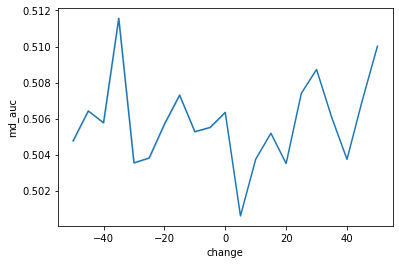

In [84]:
sns.lineplot(x="change", y="md_auc", data=grouped_df_v_r_sorted)
plt.show()

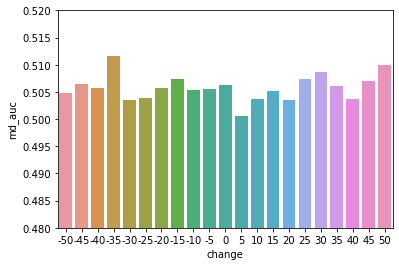

In [87]:
q=sns.barplot(x = 'change',
            y = 'md_auc',
            data = grouped_df_v_r_sorted)
 
q.set_ylim(0.48, 0.52)
# Show the plot
plt.show()


# Conclusion by changing pd parameter from -50% to 50%


#### 1. From all figures no significant trend can be detected regarding the effect of change in pd parameters, the AUC ROC results are fluctuating as pd percentage change varies 

#### 2. There is a peak as % pd change is decreased but there are many fluctuations in it. Also there is  certain peak in AUC ROC as the % change of pd increases  this Shows that there might be increment in AUC ROC as %change of pd increases.

## Hence no change or positive change in % pd might give higher AUC and slightly better results

### Note: We will use the 5% incremantal change pd values for further analysis 

# Observing the effect of change in % of distribution of dataset on results

# Data_2

In [90]:
# dataset((self,column_number,row_number,gausian_percent,poisson_perecnt,exponential_percent,binomial_precent,logistic_perecent))

data_2=dataset(20,75000,40,15,20,10,15)

dataset.count_dataset()
## Dataset Description
data_2.print_desc()
## Creating Dataset
data_2.make_gausian(500,12)

data_2.make_poisson(20)

data_2.make_exponential(50)

data_2.make_binomial(200,0.5)

data_2.make_logistic(100,5)

data_2.make_label_cl()

data_2.make_dataframe()

df_2=data_2.df

print(df_2.shape)

df_2.head()
## Dataset Distribution parameters description
data_2.print_parameters_desc()

The data frame should have columns : 20
The data frame will have rows : 75000
the  40 % of gaussian distrubution  in our dataset will have gausian distributed columns : 8
the  15 % of poisson distrubution  in our dataset will have poisson distributed columns : 3
the  20 % of exponential distrubution  in our dataset will have exponential distributed columns : 4
the  10 % of binomial distrubution  in our dataset will have binomial distributed columns : 2
the  15 % of logistic distrubution  in our dataset will have logistic distributed columns : 3
The data frame will have total columns : 20
(75000, 21)
Distribution parameters

For Gausian Distribution:
mu : [500, 541, 522, 468, 503, 407, 544, 440] 
sigma : [12, 13, 11, 12, 9, 9, 9, 13]

For Exponential Distribution:
beat : [50, 54, 46, 40]

For Poisson Distribution:
lambda : [20, 18, 22]

For Binomial Distribution:
number_of_trials : [200, 215] 
prob_of_success_of_trial : [0.5, 0.44]

For Logistic Distribution:
loc : [100, 104, 104] 
scal

## Result with decremental change in dataset parameters

In [ ]:
c =range(5,55,5)
c
dfs2=[]
for k in c:
    w= data_2.change_dataframe_decr(k)
    dfs2.append(w)
    print(k)
    res_decr = data_models(w,'data_2',str(k)+'% decr')

## Result with Incremental change in dataset parameters

In [ ]:
c =range(5,55,5)
c
dfs2=[]
for k in c:
    w= data_2.change_dataframe_incr(k)
    dfs2.append(w)
    print(k)
    res_incr = data_models(w,'data_2',str(k)+'% incr')

In [93]:
results2 = res_incr

In [95]:
print(results2.shape)

(287, 15)


In [96]:
results2

,data_name,percent_change,model_details,fit_time,predict_y_time,predict_prob,0_precission,0_recall,0_f1,1_precsiiom,1_recall,1_f1,accuracy,auc,md_auc
0,data_1,0%,Logistic,0.1309,0.0030,0.0035,0.000000,0.000000,0.000000,0.640667,1.000000,0.780983,0.640667,0.500000,0.503974
1,data_1,0%,Decision Tree,0.3403,0.0026,0.0044,0.407407,0.001361,0.002712,0.640724,0.998890,0.780687,0.640444,0.500125,0.504446
2,data_1,0%,Random Forest,3.3467,0.0724,0.0889,0.000000,0.000000,0.000000,0.640667,1.000000,0.780983,0.640667,0.500000,0.506347
3,data_1,0%,Graident Boosting,6.7242,0.0254,0.0219,0.421053,0.000989,0.001974,0.640719,0.999237,0.780789,0.640533,0.500113,0.503717
4,data_1,0%,k-NN,0.1450,4.3902,4.5221,0.352433,0.232035,0.279833,0.638528,0.760874,0.694353,0.570844,0.496454,0.496648
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282,data_2,50% incr,Random Forest,3.1298,0.0522,0.0501,0.000000,0.000000,0.000000,0.653511,1.000000,0.790453,0.653511,0.500000,0.499611
283,data_2,50% incr,Graident Boosting,5.4126,0.0076,0.0078,0.333333,0.000128,0.000256,0.653509,0.999864,0.790409,0.653467,0.499996,0.490822
284,data_2,50% incr,k-NN,0.1083,3.6353,3.2200,0.342721,0.231016,0.275994,0.652363,0.765098,0.704247,0.580044,0.498057,0.503026
285,data_2,50% incr,Naive Bayes Gaussian,0.0110,0.0056,0.0050,0.000000,0.000000,0.000000,0.653496,0.999932,0.790420,0.653467,0.499966,0.501266


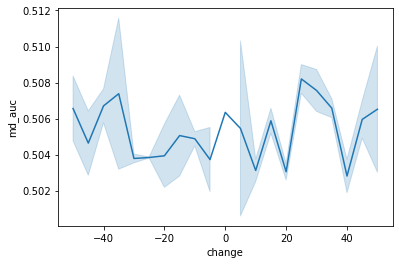

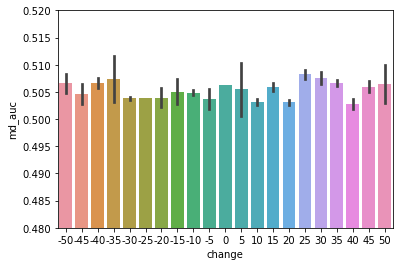

In [99]:
## Results visualizations
df_v = results2.copy()

new = df_v["percent_change"].str.split("%", n = 1, expand = True)

new.columns=['pc','type_change']

df_v['prcnt']=new['pc'].astype('int')

df_v['type_change']=new['type_change']


def sign_change(type):
    if type==' decr':
        return (-1)
    else:
        return (1)
    
df_v['sign_ch'] = df_v['type_change'].apply(sign_change)

df_v['change']=df_v.prcnt * df_v.sign_ch

df_v


df_v_r=df_v.copy()
df_v_r= df_v_r.drop(columns=['prcnt','sign_ch'])

df_v_r

df_v_r_sorted = df_v_r.sort_values("md_auc", ascending=False)

df_v_r_sorted
fig = px.bar(df_v_r_sorted, x="change", y="md_auc",color='model_details', barmode='group', title='MSE vs %change') 
fig.show()

# grouped_df_v_r_sorted = df_v_r_sorted.loc[df_v_r_sorted.groupby('change').md_auc.idxmax()].reset_index(drop=True)

grouped_df_v_r_sorted = df_v_r_sorted.loc[df_v_r_sorted.groupby(['change','data_name']).md_auc.idxmax()].reset_index(drop=True)

grouped_df_v_r_sorted
fig = go.Figure(data=go.Scatter(x=grouped_df_v_r_sorted['change'], y=grouped_df_v_r_sorted['md_auc'], mode='lines', marker=dict(color='green')))
fig.update_layout(title='MSE vs Percent incremental change of Distribution Parameter', xaxis_title='% Change', yaxis_title='MSE')
fig.show()
fig = px.bar(grouped_df_v_r_sorted, x="change", y="md_auc",color='model_details', barmode='group', title='MSE vs %change') 
fig.show()
sns.lineplot(x="change", y="md_auc", data=grouped_df_v_r_sorted)
plt.show()
q=sns.barplot(x = 'change',
            y = 'md_auc',
            data = grouped_df_v_r_sorted)
 
q.set_ylim(0.48, 0.52)
# Show the plot
plt.show()


# Final end


In [100]:
grouped_df_v_r_sorted

,data_name,percent_change,model_details,fit_time,predict_y_time,predict_prob,0_precission,0_recall,0_f1,1_precsiiom,1_recall,1_f1,accuracy,auc,md_auc,type_change,change
0,data_1,50% decr,Logistic,0.2317,0.0017,0.0023,0.000000,0.000000,0.000000,0.640667,1.000000,0.780983,0.640667,0.500000,0.504764,decr,-50
1,data_2,50% decr,Decision Tree,0.3213,0.0036,0.0031,0.371795,0.003720,0.007366,0.653599,0.996668,0.789474,0.652622,0.500194,0.508357,decr,-50
2,data_1,45% decr,Graident Boosting,5.9645,0.0101,0.0091,0.500000,0.000618,0.001235,0.640729,0.999653,0.780924,0.640667,0.500136,0.506427,decr,-45
3,data_2,45% decr,Logistic,0.1363,0.0013,0.0017,0.000000,0.000000,0.000000,0.653511,1.000000,0.790453,0.653511,0.500000,0.502859,decr,-45
4,data_1,40% decr,Graident Boosting,4.9277,0.0084,0.0087,0.500000,0.000124,0.000247,0.640679,0.999931,0.780971,0.640667,0.500027,0.505769,decr,-40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36,data_2,40% incr,Decision Tree,0.2810,0.0028,0.0029,0.295455,0.001668,0.003316,0.653411,0.997892,0.789720,0.652711,0.499780,0.501891,incr,40
37,data_1,45% incr,Logistic,0.1133,0.0016,0.0020,0.000000,0.000000,0.000000,0.640667,1.000000,0.780983,0.640667,0.500000,0.506994,incr,45
38,data_2,45% incr,Logistic,0.1748,0.0018,0.0026,0.000000,0.000000,0.000000,0.653511,1.000000,0.790453,0.653511,0.500000,0.504918,incr,45
39,data_1,50% incr,Scaled k-NN,0.1218,6.1135,6.4064,0.366530,0.243537,0.292636,0.642924,0.763926,0.698221,0.576933,0.503732,0.510018,incr,50


# Conclusion:(Change in distribution %)

### As the trend is highly fluctuating, There is no significant results that can be concluded 

# Effect of Rows on resulst

# Increasing number of rows

# Data_3 (500000 rows)

In [102]:
# dataset((self,column_number,row_number,gausian_percent,poisson_perecnt,exponential_percent,binomial_precent,logistic_perecent))

data_3=dataset(20,500000,60,5,10,20,5)

dataset.count_dataset()
## Dataset Description
data_3.print_desc()
## Creating Dataset
data_3.make_gausian(500,12)

data_3.make_poisson(20)

data_3.make_exponential(50)

data_3.make_binomial(200,0.5)

data_3.make_logistic(100,5)

data_3.make_label_cl()

data_3.make_dataframe()

df_1=data_3.df

print(df_1.shape)

df_1.head()
## Dataset Distribution parameters description
data_3.print_parameters_desc()

The data frame should have columns : 20
The data frame will have rows : 500000
the  60 % of gaussian distrubution  in our dataset will have gausian distributed columns : 12
the  5 % of poisson distrubution  in our dataset will have poisson distributed columns : 1
the  10 % of exponential distrubution  in our dataset will have exponential distributed columns : 2
the  20 % of binomial distrubution  in our dataset will have binomial distributed columns : 4
the  5 % of logistic distrubution  in our dataset will have logistic distributed columns : 1
The data frame will have total columns : 20
(500000, 21)
Distribution parameters

For Gausian Distribution:
mu : [500, 482, 552, 518, 460, 528, 502, 410, 486, 500, 431, 545] 
sigma : [12, 13, 12, 13, 9, 9, 13, 10, 11, 9, 13, 11]

For Exponential Distribution:
beat : [50, 42]

For Poisson Distribution:
lambda : [20]

For Binomial Distribution:
number_of_trials : [200, 169, 205, 163] 
prob_of_success_of_trial : [0.5, 0.56, 0.58, 0.46]

For Logisti

In [103]:
df_3_5incr=data_3.change_dataframe_incr(5)

df_3_5incr.head()

The old lamd value is : 20 new chnaged lamd value is : 21
pois1
The old mu value is : 486 new chnaged mu value is : 510
The old sigma value is : 11 new chnaged sigma value is : 11
gaus9
9
The old mu value is : 482 new chnaged mu value is : 506
The old sigma value is : 13 new chnaged sigma value is : 13
gaus2
2
The old mu value is : 500 new chnaged mu value is : 525
The old sigma value is : 12 new chnaged sigma value is : 12
gaus1
1
The old beta value is : 42 new chnaged beta value is : 44
exp2
The old mu value is : 518 new chnaged mu value is : 543
The old sigma value is : 13 new chnaged sigma value is : 13
gaus4
4


,gaus1,gaus2,gaus3,gaus4,gaus5,gaus6,gaus7,gaus8,gaus9,gaus10,...,gaus12,pois1,exp1,exp2,binom1,binom2,binom3,binom4,log1,cl
0,499.525949,519.666432,547.081465,559.841121,467.021596,533.421204,514.226847,419.690144,514.625801,488.460936,...,536.232438,23,51.263181,50.357225,89,97,121,75,101.369022,1
1,545.523347,506.626306,547.266739,558.336535,466.103664,530.575159,488.169091,415.300125,521.709326,499.181903,...,551.398542,17,10.379409,79.258719,96,102,137,81,109.190245,1
2,515.980289,494.615441,538.076336,533.239968,450.378717,529.651134,506.187455,421.546869,512.806642,512.438039,...,546.676752,28,100.471093,87.295515,88,102,121,75,87.572550,0
3,534.407967,521.985069,545.318819,575.363103,465.360137,534.752025,511.795161,415.340698,509.915370,487.709587,...,528.744754,14,32.424663,0.431863,105,94,120,74,105.936827,1
4,535.913119,486.354842,539.566505,540.440336,467.412554,527.651958,498.908625,417.505814,510.497338,494.189604,...,545.222567,23,4.747372,73.965317,118,97,122,86,96.551578,0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 21 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   gaus1   500000 non-null  float64
 1   gaus2   500000 non-null  float64
 2   gaus3   500000 non-null  float64
 3   gaus4   500000 non-null  float64
 4   gaus5   500000 non-null  float64
 5   gaus6   500000 non-null  float64
 6   gaus7   500000 non-null  float64
 7   gaus8   500000 non-null  float64
 8   gaus9   500000 non-null  float64
 9   gaus10  500000 non-null  float64
 10  gaus11  500000 non-null  float64
 11  gaus12  500000 non-null  float64
 12  pois1   500000 non-null  int32  
 13  exp1    500000 non-null  float64
 14  exp2    500000 non-null  float64
 15  binom1  500000 non-null  int32  
 16  binom2  500000 non-null  int32  
 17  binom3  500000 non-null  int32  
 18  binom4  500000 non-null  int32  
 19  log1    500000 non-null  float64
 20  cl      500000 non-null  int32  
dtypes: float64

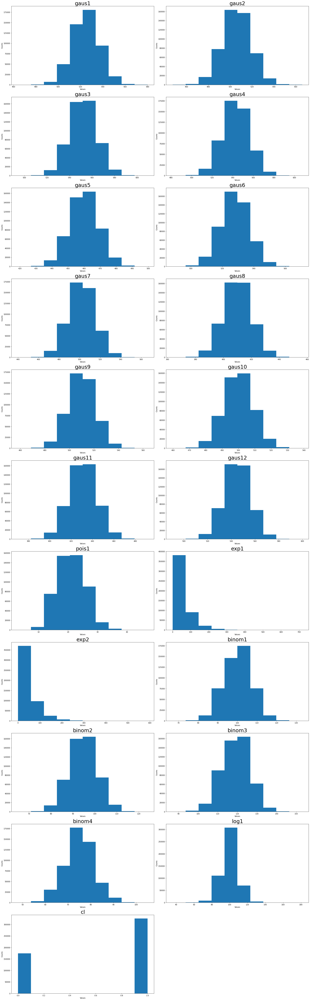

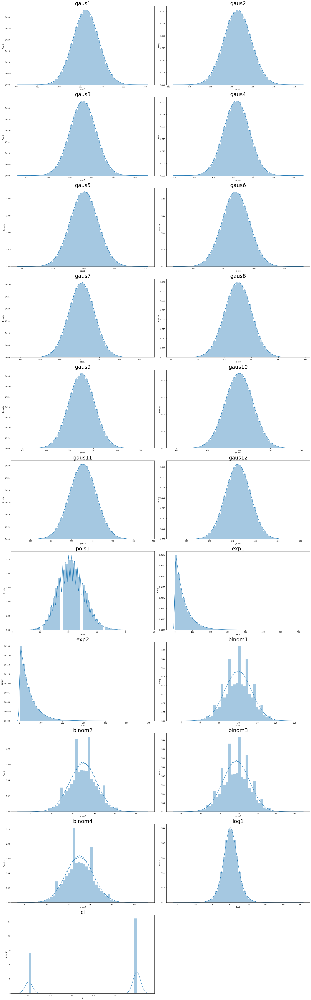

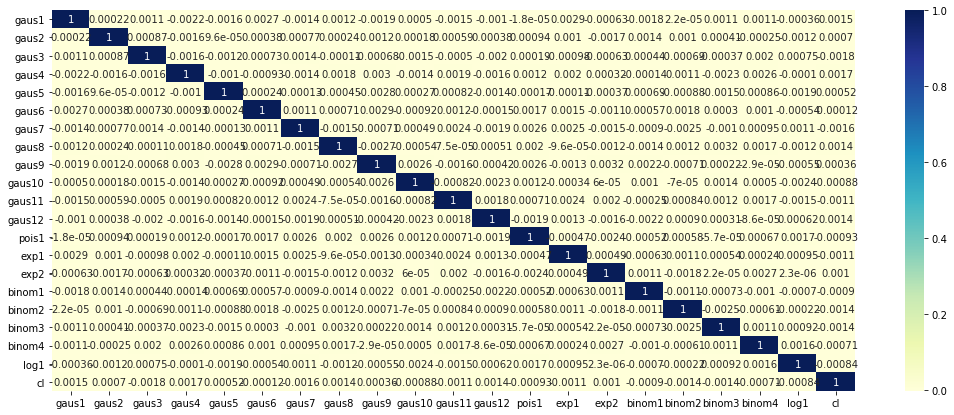

(500000, 21)
(500000, 20)
(500000,)


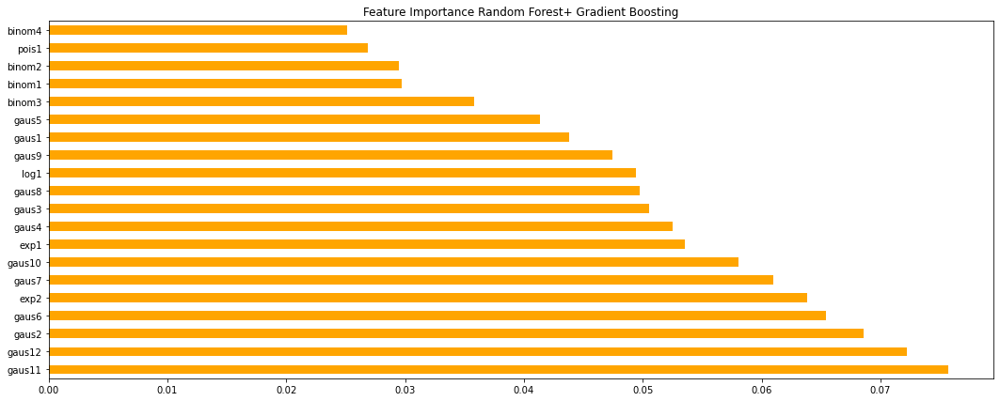

Index(['gaus11', 'gaus12', 'gaus2', 'gaus6', 'exp2', 'gaus7', 'gaus10', 'exp1',
       'gaus4', 'gaus3', 'cl'],
      dtype='object')
(500000, 11)
(500000, 10)
(500000,)
Model: Logistic   Fitting Time Duration - 0.9557
Model: Logistic   predicting Time Duration - 0.0074
Model: Logistic   predicting-y Time Duration - 0.0049
Logistic  AUC ROC score :  0.49995600511799737
{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 52324}, '1': {'precision': 0.6511733333333334, 'recall': 1.0, 'f1-score': 0.7887401282320451, 'support': 97676}, 'accuracy': 0.6511733333333334, 'macro avg': {'precision': 0.3255866666666667, 'recall': 0.5, 'f1-score': 0.39437006411602255, 'support': 150000}, 'weighted avg': {'precision': 0.4240267100444445, 'recall': 0.6511733333333334, 'f1-score': 0.5136065384346216, 'support': 150000}}
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000     52324
           1   0.651173  1.000000  0.788740     97676

    

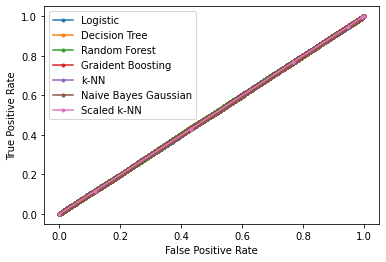

In [104]:
results_5incr = data_models(df_3_5incr,'data_3','5% incr')

In [105]:
results_5incr.tail(10)

,data_name,percent_change,model_details,fit_time,predict_y_time,predict_prob,0_precission,0_recall,0_f1,1_precsiiom,1_recall,1_f1,accuracy,auc,md_auc
284,data_2,50% incr,k-NN,0.1083,3.6353,3.2200,0.342721,0.231016,0.275994,0.652363,0.765098,0.704247,0.580044,0.498057,0.503026
285,data_2,50% incr,Naive Bayes Gaussian,0.0110,0.0056,0.0050,0.000000,0.000000,0.000000,0.653496,0.999932,0.790420,0.653467,0.499966,0.501266
286,data_2,50% incr,Scaled k-NN,0.1102,6.5838,6.9149,0.342347,0.233838,0.277875,0.652227,0.761834,0.702782,0.578889,0.497836,0.501065
287,data_3,5% incr,Logistic,0.9557,0.0049,0.0074,0.000000,0.000000,0.000000,0.651173,1.000000,0.788740,0.651173,0.500000,0.499956
288,data_3,5% incr,Decision Tree,2.9654,0.0105,0.0119,0.336245,0.001472,0.002930,0.651154,0.998444,0.788242,0.650673,0.499958,0.501405
289,data_3,5% incr,Random Forest,25.7519,0.4116,0.4170,0.000000,0.000000,0.000000,0.651173,1.000000,0.788740,0.651173,0.500000,0.500564
290,data_3,5% incr,Graident Boosting,46.4471,0.0853,0.0736,0.500000,0.000076,0.000153,0.651181,0.999959,0.788733,0.651173,0.500018,0.499936
291,data_3,5% incr,k-NN,1.5124,127.1262,123.4249,0.349089,0.233182,0.279599,0.651253,0.767087,0.704440,0.580847,0.500134,0.499956
292,data_3,5% incr,Naive Bayes Gaussian,0.0835,0.0325,0.0384,0.411765,0.000134,0.000267,0.651180,0.999898,0.788714,0.651153,0.500016,0.499196
293,data_3,5% incr,Scaled k-NN,2.0725,257.8859,234.6756,0.348820,0.231595,0.278370,0.651171,0.768398,0.704944,0.581147,0.499997,0.498956


# Data_4 (1000000 rows)

The data frame should have columns : 20
The data frame will have rows : 1000000
the  60 % of gaussian distrubution  in our dataset will have gausian distributed columns : 12
the  5 % of poisson distrubution  in our dataset will have poisson distributed columns : 1
the  10 % of exponential distrubution  in our dataset will have exponential distributed columns : 2
the  20 % of binomial distrubution  in our dataset will have binomial distributed columns : 4
the  5 % of logistic distrubution  in our dataset will have logistic distributed columns : 1
The data frame will have total columns : 20
(1000000, 21)
Distribution parameters

For Gausian Distribution:
mu : [500, 524, 427, 456, 431, 518, 589, 548, 581, 483, 430, 412] 
sigma : [12, 10, 11, 12, 11, 11, 11, 10, 11, 13, 9, 9]

For Exponential Distribution:
beat : [50, 44]

For Poisson Distribution:
lambda : [20]

For Binomial Distribution:
number_of_trials : [200, 195, 213, 189] 
prob_of_success_of_trial : [0.5, 0.54, 0.56, 0.57]

For Logi

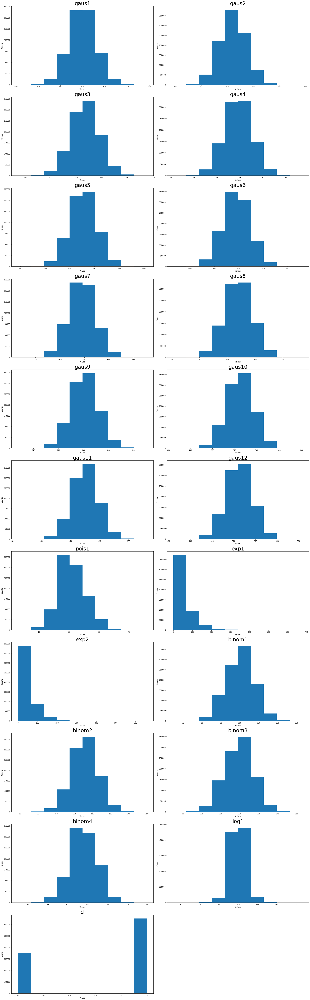

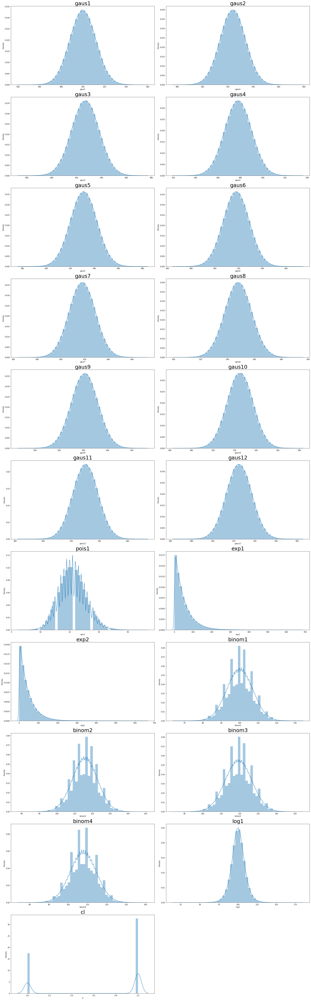

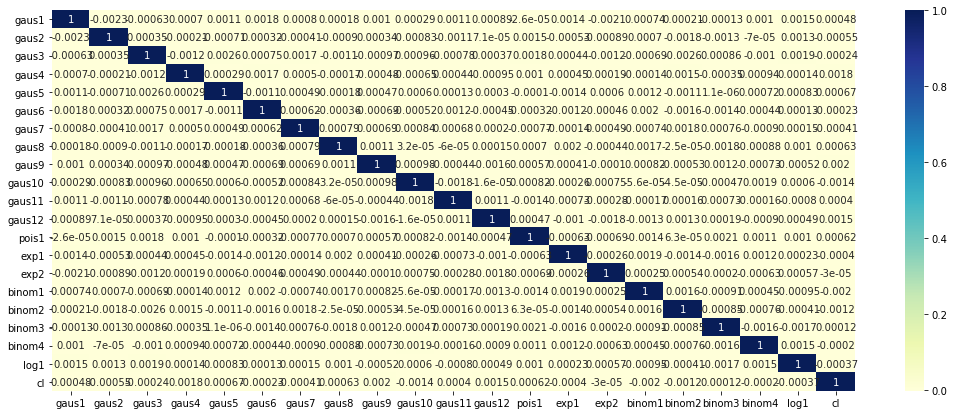

(1000000, 21)
(1000000, 20)
(1000000,)


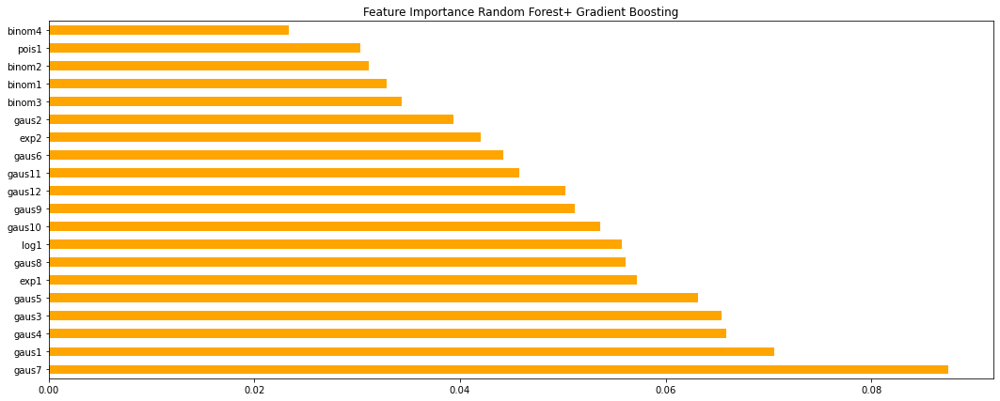

Index(['gaus7', 'gaus1', 'gaus4', 'gaus3', 'gaus5', 'exp1', 'gaus8', 'log1',
       'gaus10', 'gaus9', 'cl'],
      dtype='object')
(1000000, 11)
(1000000, 10)
(1000000,)
Model: Logistic   Fitting Time Duration - 1.8272
Model: Logistic   predicting Time Duration - 0.0169
Model: Logistic   predicting-y Time Duration - 0.0119
Logistic  AUC ROC score :  0.5011986321667302
{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 105021}, '1': {'precision': 0.64993, 'recall': 1.0, 'f1-score': 0.7878273623729493, 'support': 194979}, 'accuracy': 0.64993, 'macro avg': {'precision': 0.324965, 'recall': 0.5, 'f1-score': 0.39391368118647463, 'support': 300000}, 'weighted avg': {'precision': 0.4224090049, 'recall': 0.64993, 'f1-score': 0.512032637627051, 'support': 300000}}
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000    105021
           1   0.649930  1.000000  0.787827    194979

    accuracy                       0.649930    30000

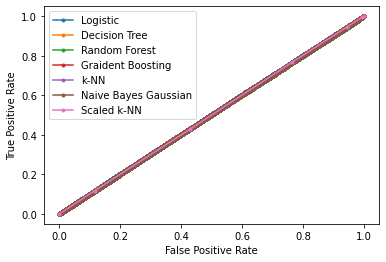

In [107]:
# Data_4
# dataset((self,column_number,row_number,gausian_percent,poisson_perecnt,exponential_percent,binomial_precent,logistic_perecent))

data_4=dataset(20,1000000,60,5,10,20,5)

dataset.count_dataset()
## Dataset Description
data_4.print_desc()
## Creating Dataset
data_4.make_gausian(500,12)

data_4.make_poisson(20)

data_4.make_exponential(50)

data_4.make_binomial(200,0.5)

data_4.make_logistic(100,5)

data_4.make_label_cl()

data_4.make_dataframe()

df_1=data_4.df

print(df_1.shape)

df_1.head()
## Dataset Distribution parameters description
data_4.print_parameters_desc()
df_4_5incr=data_4.change_dataframe_incr(5)

df_4_5incr.head()
results_5incr = data_models(df_4_5incr,'data_4','5% incr')

In [108]:
results_5incr.tail(10)

,data_name,percent_change,model_details,fit_time,predict_y_time,predict_prob,0_precission,0_recall,0_f1,1_precsiiom,1_recall,1_f1,accuracy,auc,md_auc
291,data_3,5% incr,k-NN,1.5124,127.1262,123.4249,0.349089,0.233182,0.279599,0.651253,0.767087,0.704440,0.580847,0.500134,0.499956
292,data_3,5% incr,Naive Bayes Gaussian,0.0835,0.0325,0.0384,0.411765,0.000134,0.000267,0.651180,0.999898,0.788714,0.651153,0.500016,0.499196
293,data_3,5% incr,Scaled k-NN,2.0725,257.8859,234.6756,0.348820,0.231595,0.278370,0.651171,0.768398,0.704944,0.581147,0.499997,0.498956
294,data_4,5% incr,Logistic,1.8272,0.0119,0.0169,0.000000,0.000000,0.000000,0.649930,1.000000,0.787827,0.649930,0.500000,0.501199
295,data_4,5% incr,Decision Tree,5.8705,0.0205,0.0229,0.431034,0.000476,0.000951,0.649961,0.999662,0.787745,0.649877,0.500069,0.500481
296,data_4,5% incr,Random Forest,62.7369,0.7805,0.7645,0.000000,0.000000,0.000000,0.649930,1.000000,0.787827,0.649930,0.500000,0.500104
297,data_4,5% incr,Graident Boosting,122.3271,0.1628,0.1708,0.000000,0.000000,0.000000,0.649924,0.999974,0.787815,0.649913,0.499987,0.500155
298,data_4,5% incr,k-NN,5.2218,466.7882,472.6619,0.350038,0.232915,0.279711,0.649920,0.767052,0.703645,0.580067,0.499984,0.501466
299,data_4,5% incr,Naive Bayes Gaussian,0.1723,0.0745,0.0965,0.000000,0.000000,0.000000,0.649930,1.000000,0.787827,0.649930,0.500000,0.500747
300,data_4,5% incr,Scaled k-NN,4.5000,412.3002,455.4019,0.352831,0.235839,0.282709,0.650773,0.767001,0.704123,0.581057,0.501420,0.501060


In [109]:
results = results_5incr

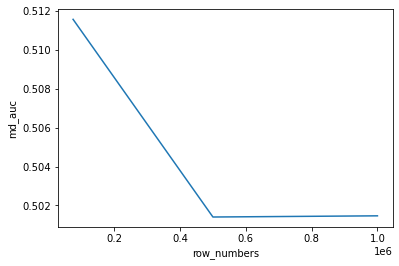

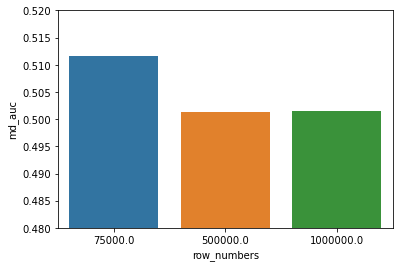

In [125]:
## Results visualizations
df_v_r = results.copy()

new = df_v_r["percent_change"].str.split("%", n = 1, expand = True)

new.columns=['pc','type_change']

df_v_r['prcnt']=new['pc'].astype('int')

df_v_r['type_change']=new['type_change']


def sign_change(type):
    if type==' decr':
        return (-1)
    else:
        return (1)
    
df_v_r['sign_ch'] = df_v_r['type_change'].apply(sign_change)

df_v_r['row_numbers']=df_v_r.prcnt * df_v_r.sign_ch

df_v_r


def rnum(rn):
    if rn=='data_1':
        return (75000)
    elif rn=='data_3':
        return (500000)
    elif rn=='data_4':
        return (1000000)
    
df_v_r['row_numbers'] = df_v_r['data_name'].apply(rnum)

df_v_r



df_v_r_r=df_v_r.copy()
df_v_r_r= df_v_r_r.drop(columns=['prcnt','sign_ch'])

df_v_r_r

df_v_r_r_sorted = df_v_r_r.sort_values("md_auc", ascending=False)

df_v_r_r_sorted
# fig = px.bar(df_v_r_r_sorted, x='row_numbers', y="md_auc",color='model_details', barmode='group', title='AUC vs row_numbers') 
# fig.show()

grouped_df_v_r_sorted_row = df_v_r_r_sorted.loc[df_v_r_r_sorted.groupby('row_numbers').md_auc.idxmax()].reset_index(drop=True)
grouped_df_v_r_sorted_row
fig = go.Figure(data=go.Scatter(x=grouped_df_v_r_sorted_row['row_numbers'], y=grouped_df_v_r_sorted_row['md_auc'], mode='lines', marker=dict(color='green')))
fig.update_layout(title='AUC vs Percent incremental change of Distribution Parameter', xaxis_title='Row_numbers', yaxis_title='AUC')
fig.show()
fig = px.bar(grouped_df_v_r_sorted_row, x='row_numbers', y="md_auc",color='model_details', barmode='group', title='AUC vs row_numbers') 
fig.show()
sns.lineplot(x='row_numbers', y="md_auc", data=grouped_df_v_r_sorted_row)
plt.show()
q=sns.barplot(x = 'row_numbers',
            y = 'md_auc',
            data = grouped_df_v_r_sorted_row)
 
q.set_ylim(0.48, 0.52)
# Show the plot
plt.show()



In [126]:
results_sorted_row = grouped_df_v_r_sorted_row.sort_values("md_auc", ascending=True)

results_sorted_row

,data_name,percent_change,model_details,fit_time,predict_y_time,predict_prob,0_precission,0_recall,0_f1,1_precsiiom,1_recall,1_f1,accuracy,auc,md_auc,type_change,row_numbers
1,data_3,5% incr,Decision Tree,2.9654,0.0105,0.0119,0.336245,0.001472,0.002930,0.651154,0.998444,0.788242,0.650673,0.499958,0.501405,incr,500000.0
2,data_4,5% incr,k-NN,5.2218,466.7882,472.6619,0.350038,0.232915,0.279711,0.649920,0.767052,0.703645,0.580067,0.499984,0.501466,incr,1000000.0
0,data_1,35% decr,Graident Boosting,4.9689,0.0079,0.0087,0.363636,0.000495,0.000988,0.640669,0.999514,0.780837,0.640533,0.500005,0.511570,decr,75000.0


# Conclusion: (effect of rows):

### It can be seen from graphs that as the number of rows have increased the AUC has  decreased and hence results are getting bad

# Final conclusions:


## With this we have come to a the following conslusions:

### 1. Increasing %pd change may slight increase AUC ROC and improve results slightly ( weak conlusion )

### 2. Increasing the number of rows decreases the AUC ROC and degrades results.